

Per il coach che correggera' questo progetto:

1. Il progetto viene mostrato seguendo la pipeline standard, dall'import alla discussione finale. Ho inserito alcuni capitoli iniziali con delle funzioni costruite da me. Ognuna ha un'accurata documentazione. In particolare:

- (-1): contiene installazioni ed imports necessari;

- (A): contiene la definizione della classe per l'Early Stopping;

- (B): contiene tutto ciò che è necessario per eseguire il training di un modello ed analizzare i risultati. La sottodivisione riguarda funzioni da usare sul train e validation set oppure sul test set. Inoltre durante il training vengono automaticamente salvate tutte le quantità necessarie per visualizzare i plot del training (funzione `training_results`) ed a studiare le metriche successivamente (funzioni `plot_confusion_matrix` e `metrics_report`);

- (C): contiene una suite completa per la visualizzazione delle immagini, dall'inversione della normalizzazione (funzione `before_preprocessing`), all' esplorazione visiva del dataset (funzione `dataset_inspection`) e delle predizioni (funzione `show_predictions`). Questa suite serve per studiare in dettaglio il dataset ed i risultati del training, per capire dove il modello sbaglio e possibilmente avere un'idea del perche';

- (D): contiene la definizione delle classi per la model explainability, ed in particolare GradCAM e Saliency Map. Questi strumenti sono stati utilizzati nel notebook per cercare di capire se i modelli stanno 'guardando' le features importanti nelle immagini.

2. Ho impostato il notebook in modo estremamente didattico, con spiegazioni dettagliate di ogni passaggio (probabilmente spiegazioni ridondanti, ma meglio abbondare in questo contesto).

3. L'approccio metodologico confronta vari modelli 'backbone' usati come baseline ed anche la data augmentation. Scelto il miglior modello baseline, si procede a cercare una prestazione migliore. **NB** dopo vari tentativi, ho notato che l'optimizer migliore e' Adam. Inoltre, non ho utilizzato K-fold cross-validation (come sarebbe giusto) per motivi di tempo e disponibilita' di risorse di calcolo (nel notebook spieghero' meglio questo punto). Quindi, i parametri migliori (architettura, regolarizzazione, learning rate) sono stati scelti facendo svariate prove con cross-validation standard (cioe' usando dapprima i train-validation sets e solo alla fine il test set).

4. Sono consapevole che le funzioni scritte manualmente da me potrebbero essere rese molto piu' robuste (controlli sugli input, type hints, eccetera), ma ho comunque messo documentazione tramite docstring. Per tenere il progetto autoconsistente ma senza esagerare, ho usato definizioni funzionali al contesto e che possono essere riutilizzate in molti altri contesti;

5. Il notebook è stato sviluppato in modo da poter essere rieseguito integralmente dall’inizio senza errori o dipendenze esterne, ed inoltre i risultati sono (il piu' possibile) riproducibili.

6. **Non ho copiato nessun codice**, usando solo la reference ufficiale di PyTorch e Torchvision ove necessario.


Chiedo al coach una valutazione il piu' possibile severa. Se fosse possibile, gradirei sapere la votazione, per poter tenere traccia delle mie skills in futuro.

# (-1) Imports, reproducibility and device setting

In [1]:
!pip install torchinfo timm

# basic imports
import os

import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import torch

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.model_selection import KFold

import torch.nn as nn
import torch.utils.data as data_utils
import torchvision
import torchvision.transforms as T
import albumentations as A
from albumentations.pytorch import ToTensorV2

# utils
from tqdm import tqdm
from IPython.display import display
from torchinfo import summary

In [2]:
from torch.amp import autocast, GradScaler

cuda_available = torch.cuda.is_available()
scaler = GradScaler(enabled = cuda_available)

device = torch.device("cuda" if cuda_available else "cpu")

In [3]:
import random
seed = 156
np.random.seed(seed)
random.seed(seed)
torch.manual_seed(seed);

if cuda_available:
    torch.cuda.manual_seed_all(seed)

# (A) Early Stopping Class

In [4]:
class EarlyStopping:
  def __init__(self, mode = "d", patience = 5, delta = 0, verbose = False, path = 'checkpoint.pt'):
    """
    mode: use "d" (default) for a metric that must be minimized, "c" otherwise
    patience: Number of epochs to wait for improvement: after
             'patient number of epochs' without improvement, training will stop
    delta: if the validation metric does not improve by at least 'delta' > 0,
           it is not considered an improvement.
    verbose: if True, print a message when validation metric does not improve
    path: path to save the model checkpoint

    """
    self.patience = patience
    self.delta = delta
    self.verbose = verbose
    self.path = path
    self.counter = 0 # counter to track epochs without improvement
    self.best_score = None
    self.early_stop = False # bool to indicate whether to stop training
    self.mode = mode

  def save_checkpoint(self, model):
    os.makedirs(os.path.dirname(self.path), exist_ok = True)
    torch.save(model.state_dict(), self.path)

  def __call__(self, val_metric, model):
    if self.best_score is None:
      self.best_score = val_metric
      self.save_checkpoint(model)

    elif (self.mode == "d" and val_metric < self.best_score - self.delta) or \
          (self.mode == "c" and val_metric > self.best_score + self.delta):
        self.best_score = val_metric
        self.save_checkpoint(model)
        self.counter = 0

    else:
      self.counter += 1
      if self.verbose:
        print(f'Epochs without improvement: {self.counter}')
      if self.counter >= self.patience:
                self.early_stop = True

# (B) Classification Utilities

## Training and Validation Utilities

### train_classification

In [5]:
def train_classification(model, loss_fn, optimizer, train_loader, val_loader, scheduler = None, epochs = 1,
                         verbose = False, confusion_matrix_data = False, early_stopping = None):
  """
  model: a model object from the class torch.nn.Module of PyTorch;
  loss_fn: a loss function. Example: loss_fn = torch.nn.CrossEntropyLoss();
  optimizer: an object of the class torch.optim. Example: optimizer = torch.optim.SGD();
  train_loader and val_loader: train and validation loader from the class torch.utils.data.DataLoader;
  scheduler: an object from torch.optim.lr_scheduler. Example: scheduler = torch.optim.lr_scheduler.StepLR(optimizer).
             Default is scheduler = None;
  epochs: number of training epochs. Default is epochs = 1;
  verbose: if True, it prints at each epoch train and validation losses and accuracies;
  confusion_matrix_data: if False, the function returns a list of lists with
                                   train_losses, train_accuracies, val_losses, val_accuracies
                                   for each epoch;
                         if True, the function returns also a list of lists with
                                   all_y_train, all_yhat_train, all_y_val, all_yhat_val
                                   that can be used to show the confusion matrix later;
  early_stopping: an object of the class EarlyStopping. Default is early_stopping = None.
  """

  train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
  all_y_train, all_yhat_train, all_y_val, all_yhat_val = [], [], [], []

  for epoch in tqdm(range(1, epochs + 1)):
    train_loss_of_batches, train_correct_predictions_of_batches = 0.0, 0.0
    val_loss_of_batches, val_correct_predictions_of_batches = 0.0, 0.0

    #################### training part ####################

    model.train()
    total_number_of_examples = 0
    for X_train, y_train in train_loader:
      batch_size = y_train.shape[0]
      total_number_of_examples += batch_size
      X_train, y_train = X_train.to(device), y_train.to(device)
      with autocast(device_type = device.type, dtype = torch.float16, enabled = cuda_available):
        logitshat_train = model(X_train)
        train_loss_of_batch = loss_fn(logitshat_train, y_train)
      optimizer.zero_grad()
      scaler.scale(train_loss_of_batch).backward()
      scaler.step(optimizer)
      scaler.update()
      train_loss_of_batches += train_loss_of_batch.item() * batch_size

      with torch.no_grad():
        yhat_train = torch.argmax(logitshat_train, dim = 1)
        train_correct_prediction_of_batch = (yhat_train == y_train).sum().item()
        train_correct_predictions_of_batches += train_correct_prediction_of_batch

    # it is useful normalize the loss, only for comparing purposes
    train_losses.append(train_loss_of_batches/total_number_of_examples)
    train_accuracies.append(train_correct_predictions_of_batches/total_number_of_examples)

    #################### validation part ####################

    total_number_of_examples = 0
    model.eval()
    for X_val, y_val in val_loader:
      with torch.no_grad():
        batch_size = y_val.shape[0]
        total_number_of_examples += batch_size
        X_val, y_val = X_val.to(device), y_val.to(device)
        with autocast(device_type = device.type, dtype = torch.float16, enabled = cuda_available):
          logitshat_val = model(X_val)
          val_loss_of_batch = loss_fn(logitshat_val, y_val)
        val_loss_of_batches += val_loss_of_batch.item() * batch_size
        yhat_val = torch.argmax(logitshat_val, dim = 1)
        val_correct_prediction_of_batch = (yhat_val == y_val).sum().item()
        val_correct_predictions_of_batches += val_correct_prediction_of_batch

    # it is useful normalize the loss, only for comparing purposes
    val_losses.append(val_loss_of_batches/total_number_of_examples)
    val_accuracies.append(val_correct_predictions_of_batches/total_number_of_examples)

    if verbose:
      print("\n","-"*160)
      print(f"\t\t\t\t\t\t\t\t\t AT EPOCH {epoch}")
      print(f"Train accuracy: {np.round(float(train_accuracies[-1]),3)}",
            " -------------- "
            f"Valid accuracy: {np.round(float(val_accuracies[-1]),3)}.")
      print(f"Train loss: {np.round(float(train_losses[-1]),3)}",
            " --------------  ",
            f"Valid loss: {np.round(float(val_losses[-1]),3)}.")

    if early_stopping is not None:
            early_stopping(val_losses[-1], model)
            if early_stopping.early_stop == True:
                print("\nEarly stopping triggered.")
                break

    if scheduler is not None:
        if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(val_losses[-1])
        else:
            scheduler.step()

  #################### the part below is needed to
  # construct all the predictions with the best weights  ####################
  if early_stopping is not None and early_stopping.early_stop:
      model.load_state_dict(torch.load(early_stopping.path))

  if confusion_matrix_data:
    model.eval()
    with torch.no_grad():
      for X_train, y_train in train_loader:
        X_train, y_train = X_train.to(device), y_train.to(device)
        with autocast(device_type = device.type, dtype = torch.float16, enabled = cuda_available):
          logitshat_train = model(X_train)
        yhat_train = torch.argmax(logitshat_train, dim = 1)
        all_y_train.extend(y_train.cpu().numpy())
        all_yhat_train.extend(yhat_train.cpu().numpy())

      for X_val, y_val in val_loader:
        X_val, y_val = X_val.to(device), y_val.to(device)
        with autocast(device_type = device.type, dtype = torch.float16, enabled = cuda_available):
          logitshat_val = model(X_val)
        yhat_val = torch.argmax(logitshat_val, dim = 1)
        all_y_val.extend(y_val.cpu().numpy())
        all_yhat_val.extend(yhat_val.cpu().numpy())

  if confusion_matrix_data == False:
    return [train_losses, train_accuracies, val_losses, val_accuracies]
  else:
    return [train_losses, train_accuracies, val_losses, val_accuracies],[all_y_train, all_yhat_train, all_y_val, all_yhat_val]

### training_results

In [6]:
def training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5)):

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize = size)
  epochs = len(train_accuracies)
  x_axis = range(1, epochs + 1)

  # left: Loss
  ax1.plot(x_axis, train_losses, label = 'Training Loss', color = 'blue', linestyle = '-')
  ax1.plot(x_axis, val_losses, label = 'Validation Loss', color = 'red', linestyle = '-')
  ax1.set_xlabel('Epoch')
  ax1.set_ylabel('Loss')
  ax1.tick_params(axis = 'y')
  ax1.legend(loc = 'best')
  ax1.set_title('Training & Validation Loss')
  ax1.grid(True)

  # right: Accuracy
  ax2.plot(x_axis, train_accuracies, label='Train Accuracy', color = 'blue', linestyle = '-')
  ax2.plot(x_axis, val_accuracies, label='Validation Accuracy', color = 'red', linestyle = '-')
  ax2.set_xlabel('Epoch')
  ax2.set_ylabel('Accuracy')
  ax2.tick_params(axis = 'y')
  ax2.legend(loc = 'best')
  ax2.set_title('Training & Validation Accuracy')
  ax2.grid(True)

  plt.tight_layout()
  plt.show()
  plt.close()

### plot_confusion_matrix

In [7]:
def plot_confusion_matrix(cm_train = None, cm_val = None, all_y = [], size = (10,4)):

  """
  cm_train and cm_test: confusion matrices fron train and test coming from the method confusion_matrix().
  all_y: list of lists of all_y_train, all_yhat_train, all_y_val, all_yhat_val
  """
  if all_y != []:
    y_train, yhat_train, y_val, yhat_val = all_y[0], all_y[1], all_y[2], all_y[3]
    y_train = np.array(y_train)
    yhat_train = np.array(yhat_train)
    y_val = np.array(y_val)
    yhat_val = np.array(yhat_val)
    cm_train = confusion_matrix(y_train, yhat_train)
    cm_val = confusion_matrix(y_val, yhat_val)

  df_cm_train = pd.DataFrame(cm_train)
  df_cm_val = pd.DataFrame(cm_val)

  fig, axes = plt.subplots(1,2,figsize = size)
  sns.heatmap(df_cm_train, cmap = "Blues", annot = True, annot_kws = {'size': 13}, ax = axes[0])
  sns.heatmap(df_cm_val, cmap = "Reds", annot = True, annot_kws = {'size': 13}, ax = axes[1])

  axes[0].set_title(f"Confusion Matrix - Train set")
  axes[0].set_xlabel("Predicted Label")
  axes[0].set_ylabel("True Label")

  axes[1].set_title(f"Confusion Matrix - Validation/Test set")
  axes[1].set_xlabel("Predicted Label")
  axes[1].set_ylabel("True Label")

  plt.show()
  plt.close()

### metrics_report

In [8]:
def metrics_report(y_train, yhat_train, y_val, yhat_val, size = (10,4), verbose = False):

  """
  verbose: if True, the function prints a summary of the standard metrics of a classification problem, both for the train and validation/test set.
  return: model, predictions, metrics, metrics_df, confusion_matrices
  """

  y_train = np.array(y_train)
  yhat_train = np.array(yhat_train)
  y_val = np.array(y_val)
  yhat_val = np.array(yhat_val)

  metrics = ["Accuracy", "F1-score", "Precision", "Recall"]
  split = ["Train", "Validation/Test"]

  # train metrics

  accuracy_train = accuracy_score(y_train, yhat_train)
  f1_train = f1_score(y_train, yhat_train, average = 'macro')
  precision_train = precision_score(y_train, yhat_train, average = 'macro')
  recall_train = recall_score(y_train, yhat_train, average = 'macro')

  # test metrics

  accuracy_val = accuracy_score(y_val, yhat_val)
  f1_val = f1_score(y_val, yhat_val, average = 'macro')
  precision_val = precision_score(y_val, yhat_val, average = 'macro')
  recall_val = recall_score(y_val, yhat_val, average = 'macro')

  # visualization

  metrics_train = [accuracy_train, f1_train, precision_train, recall_train]
  metrics_val = [accuracy_val, f1_val, precision_val, recall_val]
  metrics_df = pd.DataFrame([metrics_train, metrics_val], columns = metrics, index = split)

  cm_train = confusion_matrix(y_train, yhat_train)
  cm_val = confusion_matrix(y_val, yhat_val)
  confusion_matrices = [cm_train, cm_val]

  if verbose:
    display(metrics_df)
    plot_confusion_matrix(cm_train, cm_val, size = size)

  return metrics_train, metrics_val, metrics_df, confusion_matrices

## Test Utilities

### test_model

In [53]:
def test_model(model, loss_fn, test_loader, verbose = False, size = (4, 4)):

  all_y_test, all_yhat_test = [], []

  model.eval()
  for X_test, y_test in test_loader:
    with torch.no_grad():
      X_test, y_test = X_test.to(device), y_test.to(device)
      with autocast(device_type = device.type, dtype = torch.float16, enabled = cuda_available):
        logitshat_test = model(X_test)
      yhat_test = torch.argmax(logitshat_test, dim = 1)
      all_y_test.extend(y_test.cpu().numpy())
      all_yhat_test.extend(yhat_test.cpu().numpy())

  metrics = ["Accuracy", "F1-score", "Precision", "Recall"]
  split = ["Test"]

  y_test = np.array(all_y_test)
  yhat_test = np.array(all_yhat_test)

  # metrics computation

  accuracy_test = accuracy_score(y_test, yhat_test)
  f1_test = f1_score(y_test, yhat_test, average = 'macro')
  precision_test = precision_score(y_test, yhat_test, average = 'macro')
  recall_test = recall_score(y_test, yhat_test, average = 'macro')

  metrics_test = [accuracy_test, f1_test, precision_test, recall_test]
  metrics_df = pd.DataFrame([metrics_test], columns = metrics, index = split)

  cm_test = confusion_matrix(y_test, yhat_test)

  if verbose:
    display(metrics_df)
    df_cm_test = pd.DataFrame(cm_test)
    plt.figure(figsize = size)
    sns.heatmap(df_cm_test, cmap = "Reds", annot = True, annot_kws = {'size': 13})

    plt.title(f"Confusion Matrix - Test set")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")

    plt.show()
    plt.close()

  return metrics_test, metrics_df, cm_test

# (C) Image Visualization Utilities

In [10]:
def before_preprocessing(X, mean = None, std = None):
  '''
  function to invert the torchvision.transforms.Normalize.
  X: torch tensors (C, H, W) where colors are in RGB;
  mean and std: must be in RGB format;
  return: RGB for plotting with pixels in [0, 1.0] range.
  '''
  number_of_channels = X.shape[0]
  if mean == None:
    mean = [0] * number_of_channels
  if std == None:
    std = [1] * number_of_channels

  mean = np.array(mean)
  std = np.array(std)

  mean_np = mean.reshape((number_of_channels, 1, 1))
  std_np = std.reshape((number_of_channels, 1, 1))
  x = np.array(X)

  x = std_np * x + mean_np
  x = np.clip(x, 0, 1.0) # x can contain negative values near to 0
                           # or greater than 1.0
  return np.array(x)

In [11]:
def show_image(X, title = "", size = (2, 2)):
  '''
  X: torch or numpy array with shape (C, H, W)
  '''
  x = np.array(X)
  x = np.transpose(x, (1, 2, 0)) # shape: (H, W, C)
  plt.figure(figsize = size)
  plt.imshow(x)
  plt.axis('off')
  plt.title(f"Ground truth: {title}")
  plt.show()
  plt.close()

In [12]:
def dataset_inspection(loader, mean = None, std = None, int_to_labels = {},
                       num_images = 8, num_columns = 4, size = (2, 2)):
  '''
  int_to_labels: a dictionary in the form {integer : 'label'}
  '''
  loader_iterator = iter(loader)
  processed_images, y = next(loader_iterator)
  processed_images, y = processed_images.to(device), y.to(device)
  batch_size = processed_images.shape[0]
  if num_images > batch_size:
    num_images = batch_size

  num_rows = int(num_images/num_columns if num_images%num_columns == 0 else num_images//num_columns + 1)

  fig = plt.figure(figsize = size)

  for index in range(num_images):
    ground_truth = y[index].item()
    if int_to_labels != {}:
      ground_truth = int_to_labels[ground_truth]
    plt.subplot(num_rows, num_columns , index + 1)
    img_before_preprocessing = before_preprocessing(processed_images[index].cpu(),
                                                    mean = mean, std = std)
    plt.imshow(img_before_preprocessing.transpose(1, 2, 0))
    plt.axis('off')
    plt.title(f"Ground truth: {ground_truth}", fontsize = 12)
    plt.tight_layout()
  plt.show()
  plt.close()

In [13]:
def show_predictions(model, loader, mean = None, std = None, int_to_labels = {},
                     num_images = 8, num_columns = 4, size = (2, 2)):
  '''
  int_to_labels: a dictionary in the form {integer : 'label'}
  '''
  loader_iterator = iter(loader)
  processed_images, y = next(loader_iterator)
  processed_images, y = processed_images.to(device), y.to(device)
  batch_size = processed_images.shape[0]
  if num_images > batch_size:
    num_images = batch_size

  model.eval()
  with torch.no_grad():
    logitshat = model(processed_images)
    yhat = torch.argmax(logitshat, dim = 1)

  num_rows = int(num_images/num_columns if num_images%num_columns == 0 else num_images//num_columns + 1)

  fig = plt.figure(figsize = size)

  for index in range(num_images):
    true_label = y[index].item()
    predicted_label = yhat[index].item()
    if int_to_labels != {}:
      true_label = int_to_labels[true_label]
      predicted_label = int_to_labels[predicted_label]
    plt.subplot(num_rows, num_columns , index + 1)
    img_before_preprocessing = before_preprocessing(processed_images[index].cpu(),
                                                    mean = mean, std = std)
    plt.imshow(img_before_preprocessing.transpose(1, 2, 0))
    plt.axis('off')
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f"True: {true_label} | Predicted: {predicted_label}",
              c = color, fontsize = 10)
    plt.tight_layout()
  plt.show()
  plt.close()

# (D) Explainability Utilities

## Saliency Map

In [14]:
class SaliencyMAP:
  def __init__(self,
               model: nn.Module):
    self.model = model

  def __call__(self, X: torch.Tensor, class_idx: int = None) -> np.array:
    """
    class_idx: to study the SaliencyMAP for a specific class. The default is None, and the
               SaliencyMAP is computed for the predicted class.
    X: batch of images, with shape [B, 3, H, W]
    """
    batch_size = X.shape[0]
    H = X.shape[2]
    W = X.shape[3]
    X_with_grad = X.clone().detach().requires_grad_(True)
    self.model.eval()
    logitshat = self.model(X_with_grad) # shape: [B, num_classes]

    if class_idx is None or class_idx > logitshat.shape[1] - 1:
      class_idx = torch.argmax(logitshat, dim = 1) # shape: [B]
    else:
      class_idx = torch.tensor([class_idx] * batch_size, device = X.device) # shape: [B]

    scores = logitshat.gather(1, class_idx.view(-1, 1)).squeeze() # shape: [B]

    self.model.zero_grad()
    torch.sum(scores).backward()

    SM_k_ij = X_with_grad.grad.detach() # shape: [B, C, H, W]
    SM_ij, _ = torch.max(SM_k_ij.abs(), dim = 1, keepdim = True) # shape: [B, 1, H, W]
    # normalization of the saliency map
    min = torch.amin(SM_ij.view(batch_size, -1), dim = 1).view(batch_size, 1, 1, 1)
    max = torch.amax(SM_ij.view(batch_size, -1), dim = 1).view(batch_size, 1, 1, 1)
    normalized_SM_ij = (SM_ij - min) / (max - min + 1e-8)

    return normalized_SM_ij.detach().cpu().numpy() # shape: [B, 1, H, W]

## GradCAM

In [15]:
class GradCAM:
  def __init__(self,
               model: nn.Module,
               target_layer: nn.Module): # target layer for the GradCAM
    self.model = model
    self.target_layer = target_layer
    self.feature_maps = None
    self.gradients = None
    self._register_hooks()

  def _register_hooks(self):

    def forward_hook(layer, input, output):
      self.feature_maps = output.detach() # shape: [BATCH_SIZE, N_f, H_l, W_l]
      # print(f"Triggered with shape: {output.shape}")

    def backward_hook(layer, grad_input, grad_output):
      self.gradients = grad_output[0].detach()
      # print(f"Triggered with shape: {grad_output.shape}")

    self.target_layer.register_forward_hook(forward_hook)
    # use this as GradCAM(model = cnn, target_layer = cnn.conv2)
    self.target_layer.register_full_backward_hook(backward_hook)

  def __call__(self, X: torch.Tensor, class_idx: int = None) -> np.array:
    """
    class_idx: to study the GradCAM for a specific class. The default is None, and the
               GradCAM is computed for the predicted class.
    X: batch of images, with shape [B, 3, H, W]
    """
    X = X.to(device)
    batch_size = X.shape[0]
    H = X.shape[2]
    W = X.shape[3]
    self.model.eval()
    logitshat = self.model(X) # shape: [B, num_classes]
                              # this triggers the forward hook and save the feature maps
    A_k_ij = self.feature_maps

    # do not use max = torch.max(logitshat), to leave the possibility of choosing a class_idx
    if class_idx is None or class_idx > logitshat.shape[1] - 1:
      class_idx = torch.argmax(logitshat, dim = 1) # shape: [B]
    else:
      class_idx = torch.tensor([class_idx] * batch_size, device = X.device) # shape: [B]

    # wrong: max = torch.tensor[logitshat[i, class_idx[i].item()].item() for i in range(0, batch_size)] # shape: [B]
    scores = logitshat.gather(1, class_idx.view(-1, 1)).squeeze() # shape: [B]

    self.model.zero_grad() # do not use the optimizer; we are in the inference phase
    torch.sum(scores).backward() # this triggers the bacward hook and save the gradients wrt A_{ij}^k

    dmax_in_dA_k_ij = self.gradients # shape: [B, N_f, H_l, W_l]
    alpha_k___ = torch.mean(dmax_in_dA_k_ij, dim = (2, 3), keepdim = True) # shape: [B, N_f, 1, 1]
                                                    # to be able to multiply then with A_{ij}^k
    alpha_k___xA_k_ij = alpha_k___ * A_k_ij # Hadamard product, shape: [B, N_f, H_l, W_l]
    GC_ij = torch.nn.functional.relu(torch.sum(alpha_k___xA_k_ij, dim = 1, keepdim = True)) # shape: [B, 1, H_l, W_l]
    GC_ij_flat = GC_ij.view(batch_size, -1)
    GC_ij_min = torch.min(GC_ij_flat, dim = 1, keepdim = True)[0] # Shape: [B, 1]
    GC_ij_max = torch.max(GC_ij_flat, dim = 1, keepdim = True)[0] # Shape: [B, 1]
    GC_ij_min = GC_ij_min.view(batch_size, 1, 1, 1) # shape: [B, 1, 1, 1]
    GC_ij_max = GC_ij_max.view(batch_size, 1, 1, 1)
    normalized_GC_ij = (GC_ij - GC_ij_min) / (GC_ij_max - GC_ij_min + 1e-8)
    normalized_GC_ij_upsampled = torch.nn.functional.interpolate(normalized_GC_ij,
                                                                size = (H, W),
                                                                mode = 'bilinear',
                                                                align_corners = False)
    return normalized_GC_ij_upsampled.detach().cpu().numpy() # shape: [B, 1, H, W]


## explain_predictions

In [16]:
def explain_predictions(map_class, loader, num_images = 1,
                       cmap = 'hot', transparency = 0.6,
                       mean = 0, std = 0, size = (2, 2), class_idx = None):
  """
  transparency: real number in [0, 1.0]. Higher transparency, lower intensity of
                the original image in the final superposition.
  """
  if isinstance(map_class, SaliencyMAP):
    title = "Saliency Map"
  elif isinstance(map_class, GradCAM):
    title = "GradCAM"

  X, _ = next(iter(loader)) # X.shape: [B, C, H, W]
  X = X.to(device)
  maps = map_class(X) # shape: [B, 1, H, W]
  batch_size = X.shape[0]
  if num_images > batch_size:
    num_images = batch_size

  for i in range(num_images):

    img = X[i].cpu() # shape: [C, H, W]
    img = before_preprocessing(img, mean, std) # shape: [C, H, W]
    img = img.transpose(1, 2, 0) # shape: [H, W, C]

    map = maps[i] # shape: [1, H, W]
    map = map.squeeze() # shape: [H, W]
    my_colormap = plt.get_cmap(cmap)
    heatmap_rgb = my_colormap(map)
    heatmap_rgb = heatmap_rgb[:, :, :3] # shape: [H, W, C]

    fig, axes = plt.subplots(1, 3, figsize = size)
    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(heatmap_rgb)
    axes[1].set_title(title)
    axes[1].axis("off")
    axes[2].imshow((1 - transparency) * img +  transparency * heatmap_rgb)
    axes[2].set_title("Superposition")
    axes[2].axis("off")

    plt.axis("off")
    plt.show()
    plt.close()

# Food Classification

## Dataset Exploration

Per accedere al dataset, salvato su drive, si monta drive e inoltre si copia il contenuto nella VM di Colab per velocizzare la lettura delle immagini:

In [17]:
from google.colab import drive
drive.mount('/drive')

BASE_PATH = "/drive/Othercomputers/Il mio MacBook Pro/My notebooks/Profession AI - AI Engineering/Corso 7: Deep Learning applicato con PyTorch/Progetto/dataset"

# paths to work from drive
train_path = os.path.join(BASE_PATH, "train")
valid_path = os.path.join(BASE_PATH, "val")
test_path = os.path.join(BASE_PATH, "test")

Mounted at /drive


In [18]:
# about 5 minutes

!cp -r "$BASE_PATH" /content/

In [19]:
NEW_BASE_PATH = "/content/dataset"

# paths to work from /content in the Colab VM
train_path = os.path.join(NEW_BASE_PATH, "train")
valid_path = os.path.join(NEW_BASE_PATH, "val")
test_path = os.path.join(NEW_BASE_PATH, "test")

La struttura del dataset si presta perfettamente all'uso di `ImageFolder` per creare dei dataset di PyTorch. Per farlo, e' necessario definire un set di trasformazioni (per esempio normalizzazione attraverso media $\mu$ e deviazione standard $\sigma$). Osservazione:

- Non sono noti a priori $\mu$ e $\sigma$. Usare (come spesso si fa) quelle di ImageNet non e' appropriato in questo caso, visto che abbiamo solo cibo e non le altre molte classi di ImageNet;

Quindi, dopo un'analisi esplorativa del dataset (dimensioni del dataset, distribuzione delle classi, visionamento di alcune immagini,...) calcoleremo $\mu_{train}$ e $\sigma_{train}$ del dataset **di train** per poi normalizzare l'intero dataset, come da best practices. E' chiaro che l'analisi di dimensioni e distribuzione sarebbe stata molto piu' veloce usando `os`, ma l'ho incorporata in un'unica funzione perche' l'analisi di $(\mu_{train}\,,\sigma_{train})$, invece, non poteva essere fatta in altro modo (seppur lento). **NB** L' analisi di $\mu_{train}$ e $\sigma_{train}$ sull'intero dataset di train richiederebbe troppo tempo. Per bypassare questo problema creeremo un sotto-dataset di train con la stessa stratificazione del dataset di train (altrimenti il calcolo sarebbe fuorviante). A tal fine, lo strumento perfetto e' sicuramente il `train_test_split` di scikit-learn. Per correttezza, manterremo le stesse proporzioni nei sub-dataset rispetto ad i dataset originale:

In [20]:
RESIZE_DIM = 224 # this is an hyperparameter, used by the ImageNet models

no_transform = T.Compose([
    T.Resize(size = (RESIZE_DIM, RESIZE_DIM)), # resize for faster analysis and training
    T.ToTensor()]) # only transform in PyTorch tensors in range [0, 1.0]

train_dataset = torchvision.datasets.ImageFolder(train_path,
                                                 transform = no_transform)
valid_dataset = torchvision.datasets.ImageFolder(valid_path,
                                                 transform = no_transform)
test_dataset = torchvision.datasets.ImageFolder(test_path,
                                                 transform = no_transform)

labels_to_int = train_dataset.class_to_idx  # {'Baked Potato': 0,
                                            # 'Crispy Chicken': 1,
                                            # 'Donut': 2,
                                            # 'Fries': 3,
                                            # 'Hot Dog': 4,
                                            # 'Sandwich': 5,
                                            # 'Taco': 6,
                                            # 'Taquito': 7,
                                            # 'apple_pie': 8,
                                            # 'cheesecake': 9,
                                            # 'chicken_curry': 10,
                                            # 'ice_cream': 11,
                                            # 'omelette': 12,
                                            # 'sushi': 13}
int_to_labels = {i:l for l, i in labels_to_int.items()}

train_dim = len(train_dataset) # 8960
valid_dim = len(valid_dataset) # 2240
test_dim = len(test_dataset) # 2800
num_classes = len(labels_to_int) # 14 classes

################################ construction of stratified subsets ################################
def create_subset(dataset, keeps_only: int):
  """
  keeps_only: integer representing the dimension of the resulting subset.
  """
  labels = dataset.targets
  indices = np.arange(len(dataset))
  sub_indices, _ = train_test_split(indices, train_size = keeps_only,
                                     stratify = labels,
                                     random_state = seed) # reproducibility
  subset = torch.utils.data.Subset(dataset, sub_indices)
  return subset


# keep 1000 images in the train set, and compute the other quantities to reflect the original proportion
keeps_only_train = 1000
keeps_only_val = int(valid_dim*keeps_only_train/train_dim) # 250
keeps_only_test = int(test_dim*keeps_only_train/train_dim) # 312

subset_train_dataset = create_subset(train_dataset, keeps_only_train)
subset_valid_dataset = create_subset(valid_dataset, keeps_only_val)
subset_test_dataset = create_subset(test_dataset, keeps_only_test)

sub_train_loader = data_utils.DataLoader(subset_train_dataset, batch_size = 128, shuffle = True,
                                         num_workers = 2, pin_memory = True)
sub_valid_loader = data_utils.DataLoader(subset_valid_dataset, batch_size = 128, shuffle = False,
                                         num_workers = 2, pin_memory = True)
sub_test_loader = data_utils.DataLoader(subset_test_dataset, batch_size = 128, shuffle = False,
                                        num_workers = 2, pin_memory = True)

Visioniamo alcune immagini dal set di train. Dall'ispezione notiamo che il modello potrebbe far fatica a distinugere alcune classi, che sono molto simili (per esempio 'Baked Potato', 'Crispy Chicken' e 'Fries'). Oltre a questa **inter-class similarity**, c'e' anche una forte componente di **intra-class dissimilarity**, nel senso che in una stessa classe ci sono immagini molto diverse (per esempio immagini di 'ice_cream' e immagini di barattoli di 'ice_cream'). Capiamo da subito che il task sara' piuttosto complicato:

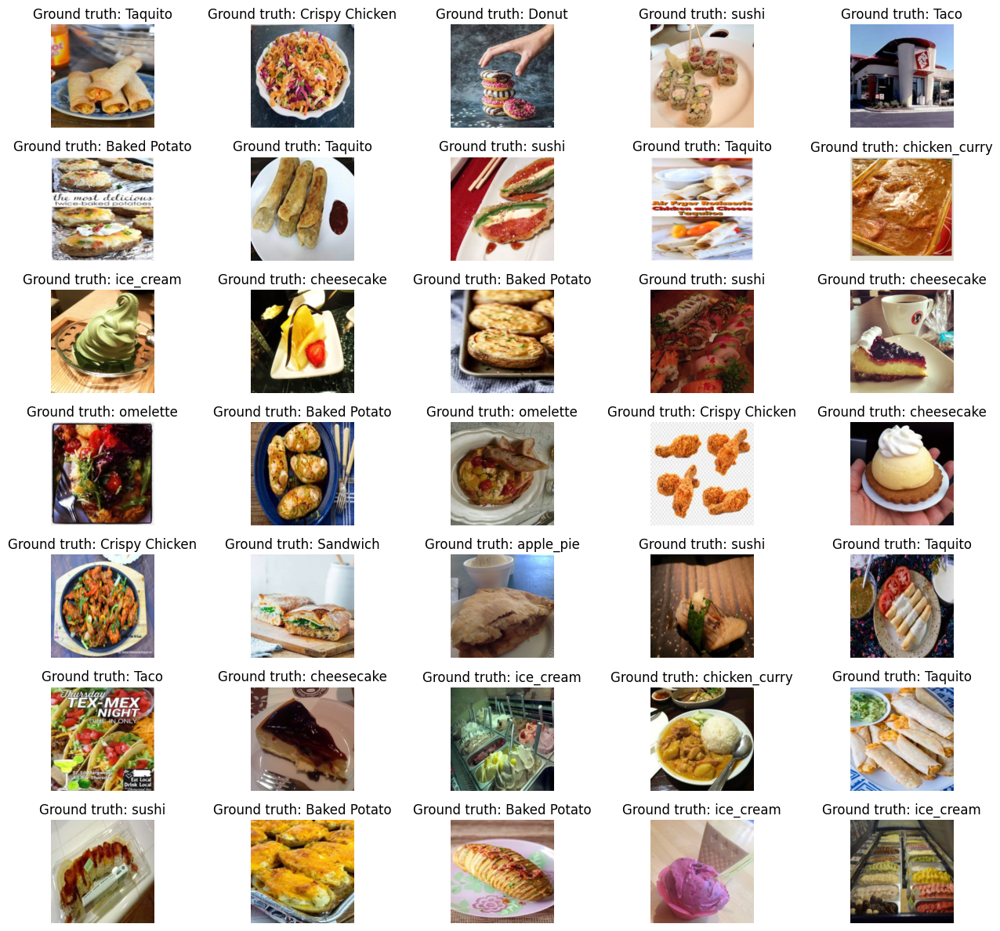

In [21]:
dataset_inspection(sub_train_loader, int_to_labels = int_to_labels,
                   num_images = 35, num_columns = 5, size = (15, 12))

In [22]:
################# THIS CELL IS NEEDED ONLY THE FIRST TIME TO EXPLORE THE DATASET #################

def inspect_dataloader(dataloader, loader_type = None):
  """
  Scope: this function checks the labels distribution and computes [mean, standard
         deviation] of a dataloader;
  Input: a PyTorch DataLoader object;
  Return: mean and standard deviation of the dataset associated to the DataLoader, in RGB format.
  """
  if loader_type is not None:
    print(f"\n\t\t\t\t\tINSPECTING THE {loader_type} DATASET")

  all_labels = []

  mean_sum = torch.zeros(3)
  square_sum = torch.zeros(3)
  total_pixels = 0

  for batch_images, batch_labels in tqdm(dataloader):
    B, C, H, W = batch_images.shape
    num_pixels_in_batch = B * H * W

    mean_sum += torch.sum(batch_images, dim = [0, 2, 3])
    square_sum += torch.sum(batch_images**2, dim = [0, 2, 3])

    all_labels.extend(batch_labels.tolist())
    total_pixels += num_pixels_in_batch

  mean_rgb = (mean_sum/total_pixels)
  mean_square_rgb = square_sum/total_pixels
  std_rgb = (torch.sqrt(mean_square_rgb - mean_rgb ** 2)) # very defintion of std dev

  all_labels = np.array(all_labels)
  labels_unique, label_counts = np.unique(all_labels, return_counts = True)
  total_labels = len(all_labels)
  for label, count in zip(labels_unique, label_counts):
    percentage = np.round(count/total_labels * 100, 2)
    print(f"\nThere are {count} images ({percentage}%) belonging to class {label}.")

  print(f"The mean is {np.round(mean_rgb.numpy(),3)} and the standard deviation is {np.round(std_rgb.numpy(),3)}.\n")

  return [mean_rgb, std_rgb]

mean_rgb, std_rgb = inspect_dataloader(sub_train_loader, loader_type = "TRAIN")
_, _ = inspect_dataloader(sub_valid_loader, loader_type = "VALIDATION")
_, _ = inspect_dataloader(sub_test_loader, loader_type = "TEST")



					INSPECTING THE TRAIN DATASET


100%|██████████| 8/8 [00:02<00:00,  2.87it/s]



There are 72 images (7.2%) belonging to class 0.

There are 71 images (7.1%) belonging to class 1.

There are 71 images (7.1%) belonging to class 2.

There are 72 images (7.2%) belonging to class 3.

There are 71 images (7.1%) belonging to class 4.

There are 71 images (7.1%) belonging to class 5.

There are 72 images (7.2%) belonging to class 6.

There are 71 images (7.1%) belonging to class 7.

There are 72 images (7.2%) belonging to class 8.

There are 72 images (7.2%) belonging to class 9.

There are 72 images (7.2%) belonging to class 10.

There are 71 images (7.1%) belonging to class 11.

There are 71 images (7.1%) belonging to class 12.

There are 71 images (7.1%) belonging to class 13.
The mean is [0.614 0.51  0.411] and the standard deviation is [0.276 0.284 0.304].


					INSPECTING THE VALIDATION DATASET


100%|██████████| 2/2 [00:00<00:00,  2.24it/s]



There are 18 images (7.2%) belonging to class 0.

There are 18 images (7.2%) belonging to class 1.

There are 18 images (7.2%) belonging to class 2.

There are 18 images (7.2%) belonging to class 3.

There are 18 images (7.2%) belonging to class 4.

There are 18 images (7.2%) belonging to class 5.

There are 18 images (7.2%) belonging to class 6.

There are 18 images (7.2%) belonging to class 7.

There are 18 images (7.2%) belonging to class 8.

There are 18 images (7.2%) belonging to class 9.

There are 18 images (7.2%) belonging to class 10.

There are 18 images (7.2%) belonging to class 11.

There are 17 images (6.8%) belonging to class 12.

There are 17 images (6.8%) belonging to class 13.
The mean is [0.613 0.507 0.4  ] and the standard deviation is [0.277 0.285 0.307].


					INSPECTING THE TEST DATASET


100%|██████████| 3/3 [00:01<00:00,  2.89it/s]


There are 23 images (7.37%) belonging to class 0.

There are 22 images (7.05%) belonging to class 1.

There are 22 images (7.05%) belonging to class 2.

There are 23 images (7.37%) belonging to class 3.

There are 22 images (7.05%) belonging to class 4.

There are 22 images (7.05%) belonging to class 5.

There are 22 images (7.05%) belonging to class 6.

There are 22 images (7.05%) belonging to class 7.

There are 23 images (7.37%) belonging to class 8.

There are 23 images (7.37%) belonging to class 9.

There are 22 images (7.05%) belonging to class 10.

There are 22 images (7.05%) belonging to class 11.

There are 22 images (7.05%) belonging to class 12.

There are 22 images (7.05%) belonging to class 13.
The mean is [0.607 0.493 0.38 ] and the standard deviation is [0.277 0.28  0.295].



Dall'esecuzione della cella precedente, vediamo che le classi sono perfettamente bilanciate, che il test set rappresenta esattamente il 20% dei dati totali, e che le $(\mu\,, \sigma)$ sui vari set sono simili (come ci si aspetta, d'altronde!).

Possiamo quindi procedere a definire delle trasformazioni "baseline", su cui applicare i nostri modelli.  Testero' alcuni modelli base su cui fare transfer learning. Uno piccolo (EfficientNet-B0), uno medio (ConvNeXt-Tiny/ResNet50) ed uno grande (VGG16):


In [23]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import vgg16, VGG16_Weights

################## BASELINE MODEL: EfficientNet_B0 ##################
efficientnet_full = efficientnet_b0(weights = EfficientNet_B0_Weights.IMAGENET1K_V1)
for param in efficientnet_full.features.parameters():
  param.requires_grad = False
################## BASELINE MODEL: ConvNeXt_Tiny ##################
convnext_full = convnext_tiny(weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
for param in convnext_full.features.parameters():
  param.requires_grad = False
################## BASELINE MODEL: ResNet50 ##################
resnet_full = resnet50(weights = ResNet50_Weights.IMAGENET1K_V1)
for param in resnet_full.parameters(): # the names of the layers are different
  param.requires_grad = False
################## BASELINE MODEL: VGG16 ##################
vgg16_full = vgg16(weights = VGG16_Weights.IMAGENET1K_V1)
for param in vgg16_full.features.parameters():
  param.requires_grad = False

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 131MB/s] 


Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 190MB/s] 


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 190MB/s]


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:02<00:00, 209MB/s]


Per definire le augmentations, useremo albumentations (che e' piu' flessibile di torchvision per la data augmentation!). A tal fine, e' necessario definire una classe Transform:

In [24]:
class Transforms:
  def __init__(self, augmentations):
    self._augmentations = augmentations
  def __call__(self, img, *args, **kwargs):
    return self._augmentations(image = np.array(img))['image']

Il procedimento, d'ora in poi, sara' strutturato nel seguente modo:
- Scegliere il modello migliore utilizzando i sotto-set per risparmiare tempo e risorse computazionali. A tal fine, si vedra' il comportamento dei tre modelli indicati senza e con augmentation. Ci si aspetta che i modelli senza augmentation overfittino velocemente, ma danno una prima indicazione su quale optimizer scegliere e su quale sia un learning rate sensato. Dopodiché, si provera' anche a modificare la testa di classificazione, per vedere se si guadagna in performances;

- Usare il miglior modello per fare training e test sull'intero dataset.

Ovviamente non c'e' sicurezza matematica che il miglior modello sui subset sia anche il modello migliore sul dataset intero. Tuttavia, questo e' il miglior approccio per avere un compromesso tempo-risorse ed anche concettualmente e' robusto perche' i subset sono stati costruiti rispecchiando al meglio la struttura dei dataset originali.

## Step 0: Baseline models - without data augmentation

In [25]:
MEAN_RGB = [0.614, 0.510, 0.411] # mean found in the previous section
STD_RGB = [0.276, 0.284, 0.304] # std dev found in the previous section
RESIZE_DIM = 224 # this is an hyperparameter

baseline_transforms = A.Compose([
    A.Resize(RESIZE_DIM, RESIZE_DIM),
    A.Normalize(mean = MEAN_RGB, std = STD_RGB),
    ToTensorV2()])

train_dataset = torchvision.datasets.ImageFolder(train_path,
                                                 transform = Transforms(baseline_transforms))
valid_dataset = torchvision.datasets.ImageFolder(valid_path,
                                                 transform = Transforms(baseline_transforms))

subset_train_dataset = create_subset(train_dataset, keeps_only_train)
subset_valid_dataset = create_subset(valid_dataset, keeps_only_val)

train_loader = data_utils.DataLoader(subset_train_dataset, batch_size = 128, shuffle = True,
                                     num_workers = 2, pin_memory = True)
valid_loader = data_utils.DataLoader(subset_valid_dataset, batch_size = 128, shuffle = False,
                                     num_workers = 2, pin_memory = True)

Visto che su colab si hanno poche risorse computazionali, il tempo speso a fare training dovra' essere il minore possibile. Per questo motivo sara' fondamentale gestire al meglio il numero di epoche (attraverso la classe `EarlyStopping` -con poca `patience`- definita all'inizio) ed anche la velocita' del training (eventualmente diminuendo il batch size). Infine, la funzione per il train del modello definita all'inizio sfrutta la mixed precision di PyTorch per velocizzare alcuni passaggi. Il settaggio dei `num_workers`nei dataloader ed il fatto di aver copiato il dataset su Colab, e' un'ulteriore fonte di velocita'.

**NB**: in senso assoluto, si dovrebbe fare hyperparameter tuning, ma non si potra' farlo in questo contesto in quanto richiederebbe troppe risorse di calcolo.

Il modello baseline qui sotto aggiunge il minor numero possibile di parametri, nel senso che la testa di classificazione non ha layer nascosti. In pratica, e' come fare logistic regression dopo l'estrazione delle features:

In [26]:
class BaselineModel(nn.Module):
  def __init__(self, backbone: nn.Module, N_f):
    """
    backbone: a nn.Module, which extracts the features;
    N_f: the number of feature maps in output of the backbone
    """
    super().__init__()
    self.features = backbone
    self.N_f = N_f
    self.classification_head = nn.Sequential(
        nn.AdaptiveAvgPool2d((1, 1)), # X.shape: [B, N_f, 1, 1]
        nn.Flatten(), # X.shape: [B, N_f]
        nn.Linear(self.N_f, 14)) # X.shape: [B, 14]

  def forward(self, X): # X.shape: [B, C = 3, RESIZE_DIM, RESIZE_DIM]
    X = self.features(X)  # X.shape: [B, N_f, ..., ...]
    X = self.classification_head(X) # X.shape: [B, 14]
    return X

X_example = torch.randn((1, 3, RESIZE_DIM, RESIZE_DIM)) # useful to uncover automatically N_f, the number of filters for the models

N_f_efficientnet = efficientnet_full.features(X_example).shape[1]

N_f_convnext = convnext_full.features(X_example).shape[1]

N_f_vgg16 = vgg16_full.features(X_example).shape[1]

### EfficientNet

100%|██████████| 50/50 [02:32<00:00,  3.04s/it]


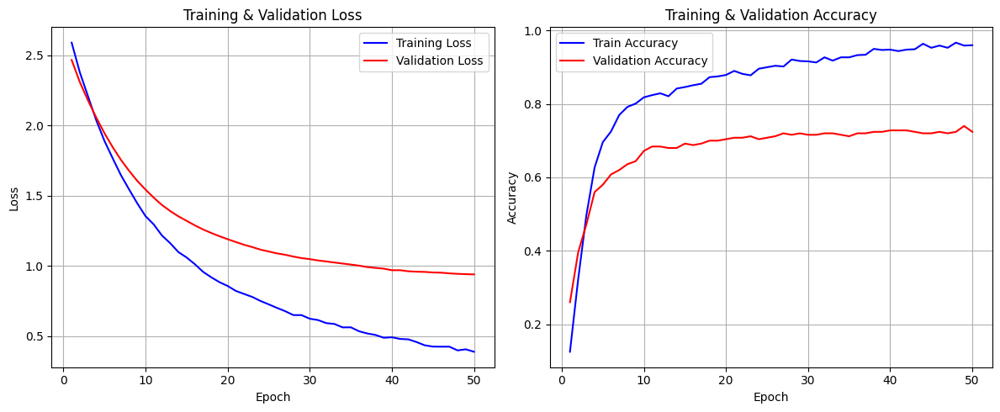

In [27]:
my_efficientnet = BaselineModel(backbone = efficientnet_full.features,
                                N_f = N_f_efficientnet).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_efficientnet.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_efficientnet, loss_fn, optimizer,
                                     train_loader, valid_loader,
                                     epochs = EPOCHS, verbose = False,
                                     confusion_matrix_data = True,
                                     early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.987,0.987017,0.987222,0.986977
Validation/Test,0.724,0.724384,0.737827,0.724323


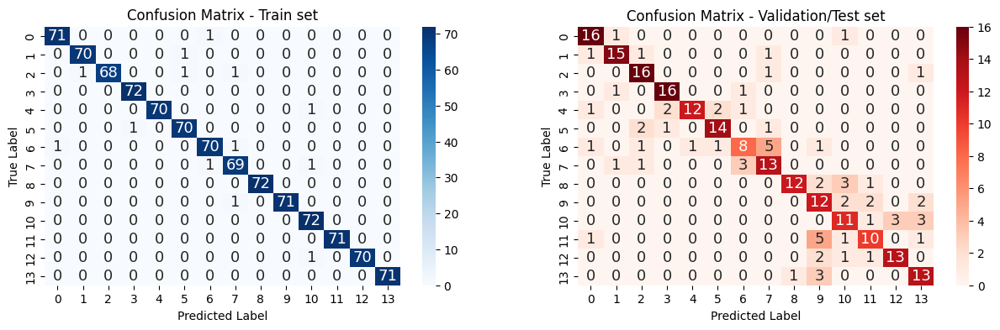

In [28]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

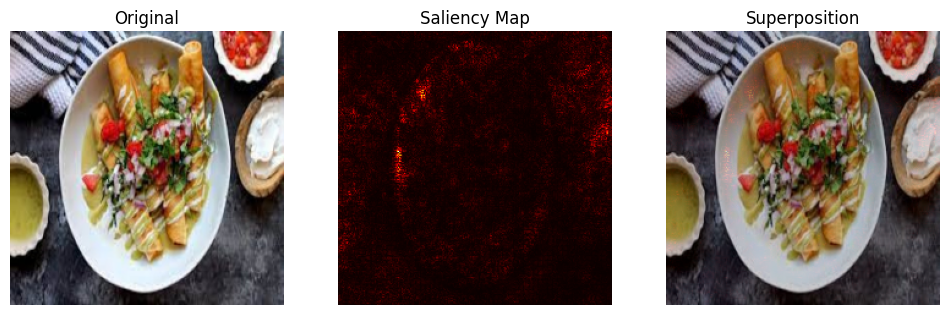

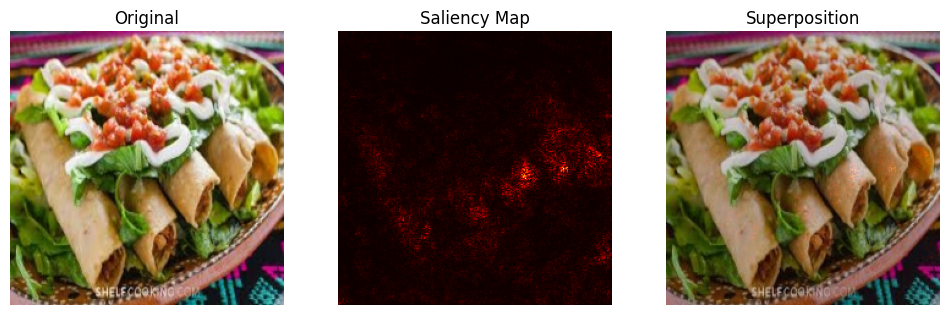

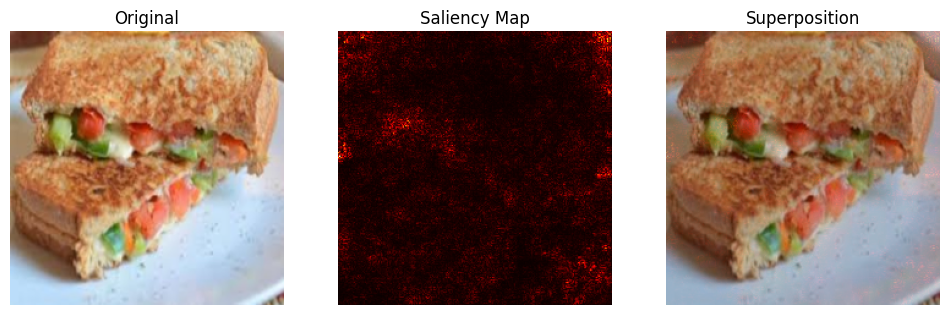

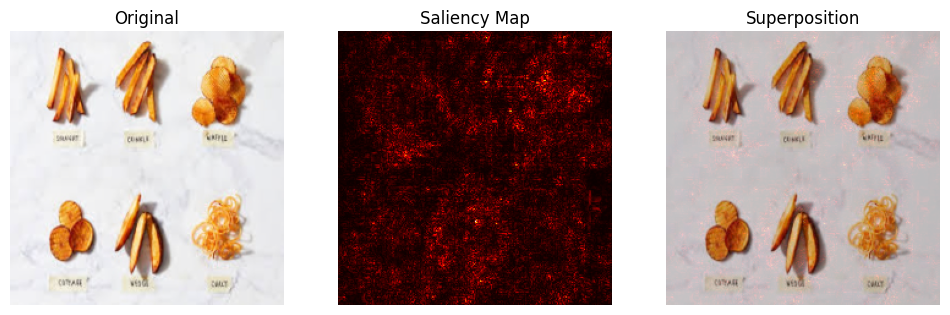

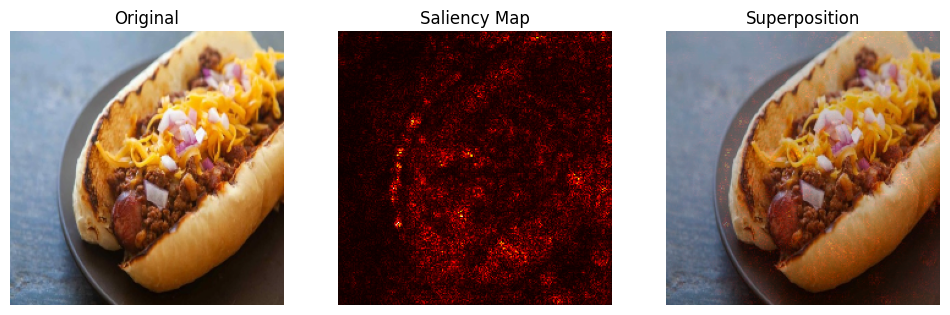

In [29]:
sm = SaliencyMAP(my_efficientnet)

explain_predictions(sm, valid_loader, num_images = 5,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,6))

### ConvNeXt

100%|██████████| 50/50 [02:49<00:00,  3.39s/it]


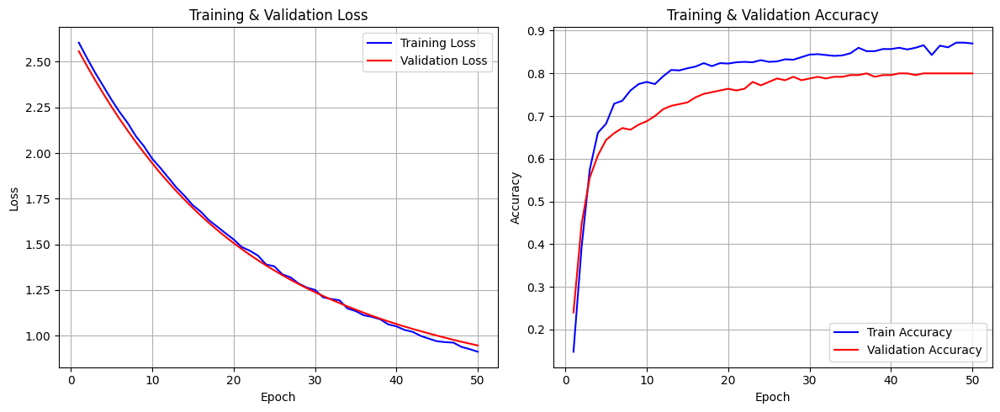

In [30]:
my_convnext = BaselineModel(backbone = convnext_full.features,
                            N_f = N_f_convnext).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_convnext.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_convnext, loss_fn, optimizer,
                                      train_loader, valid_loader,
                                      epochs = EPOCHS, verbose = False,
                                      confusion_matrix_data = True,
                                      early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.885,0.885874,0.889401,0.885102
Validation/Test,0.800,0.798610,0.808113,0.800187


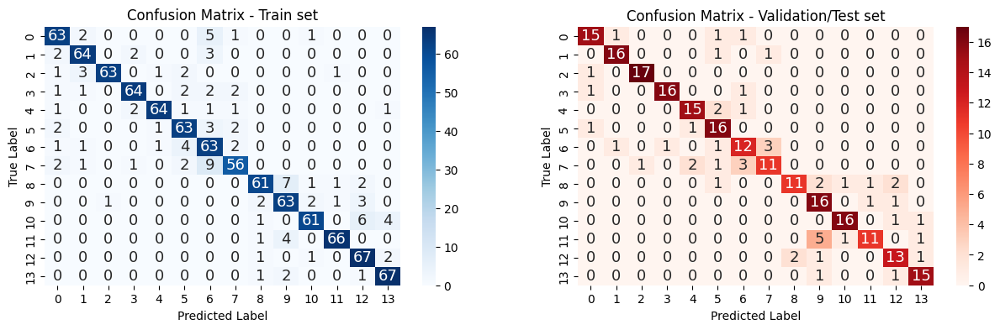

In [31]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

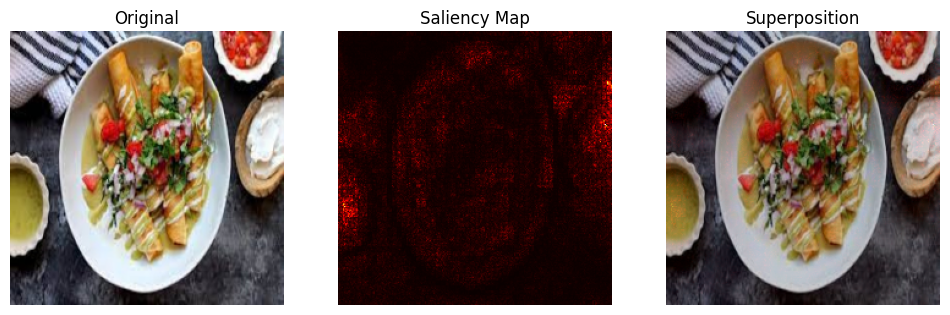

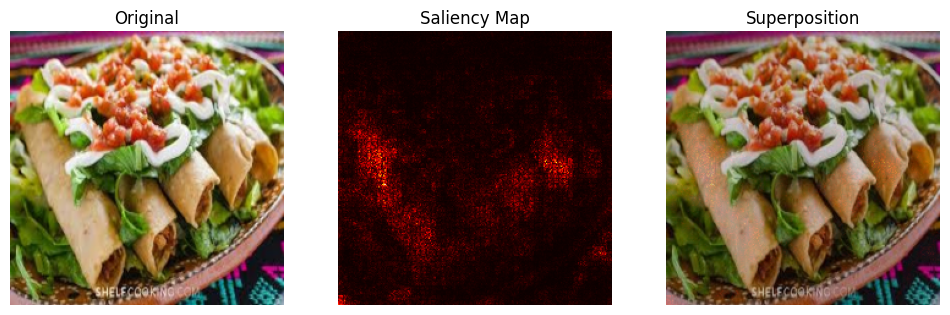

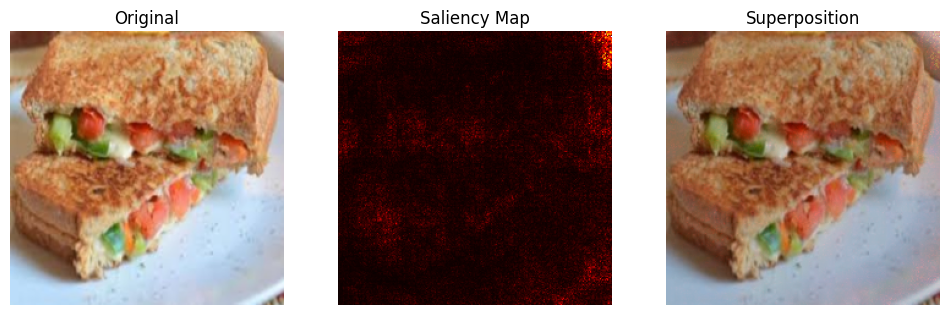

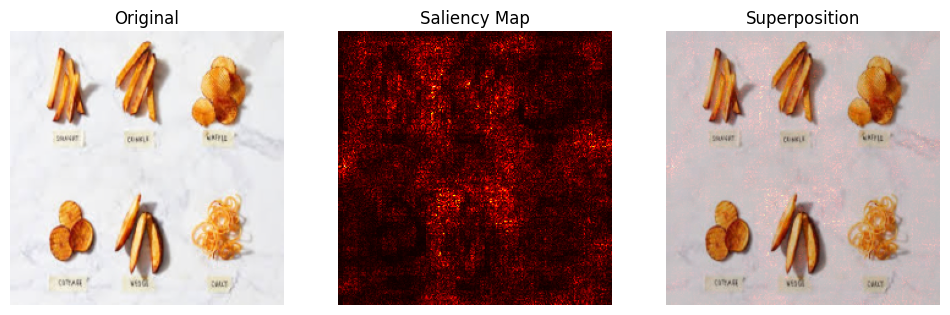

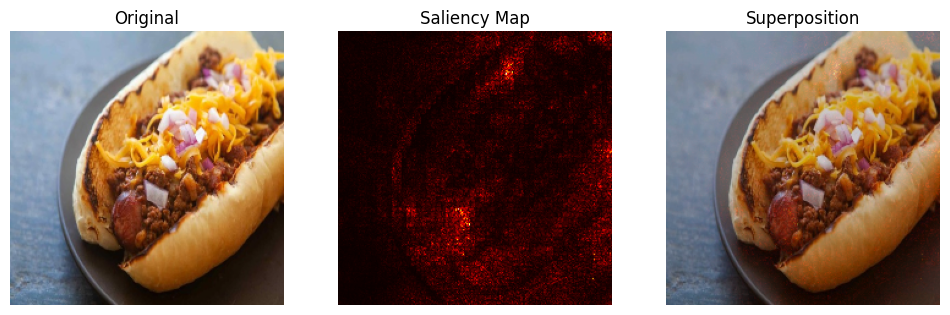

In [32]:
sm = SaliencyMAP(my_convnext)

explain_predictions(sm, valid_loader, num_images = 5,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,6))

### VGG16

100%|██████████| 50/50 [02:26<00:00,  2.93s/it]


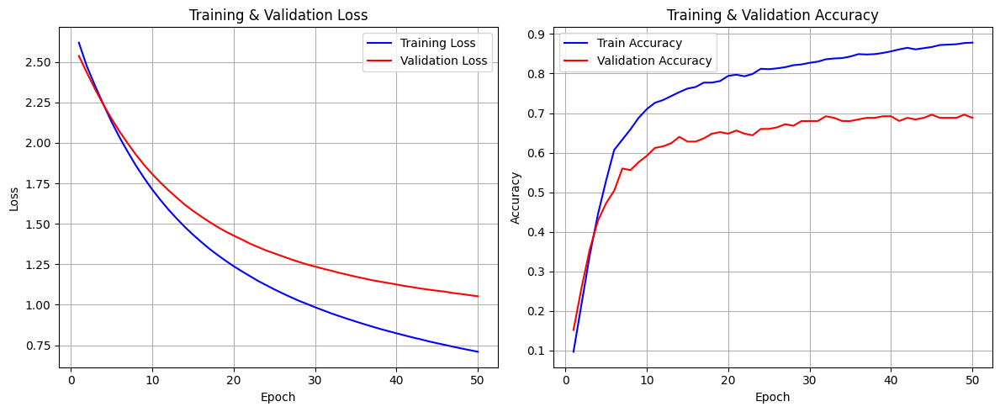

In [33]:
my_vgg16 = BaselineModel(backbone = vgg16_full.features,
                         N_f = N_f_vgg16).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_vgg16.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_vgg16, loss_fn, optimizer,
                                      train_loader, valid_loader,
                                      epochs = EPOCHS, verbose = False,
                                      confusion_matrix_data = True,
                                      early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.879,0.879864,0.883571,0.879066
Validation/Test,0.688,0.686897,0.692773,0.688609


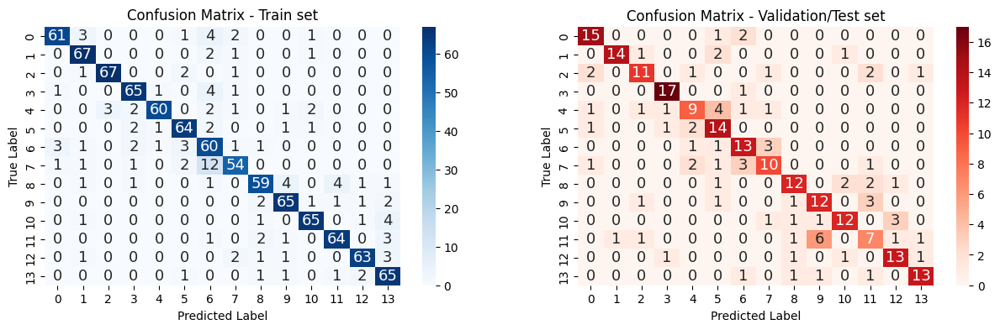

In [34]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

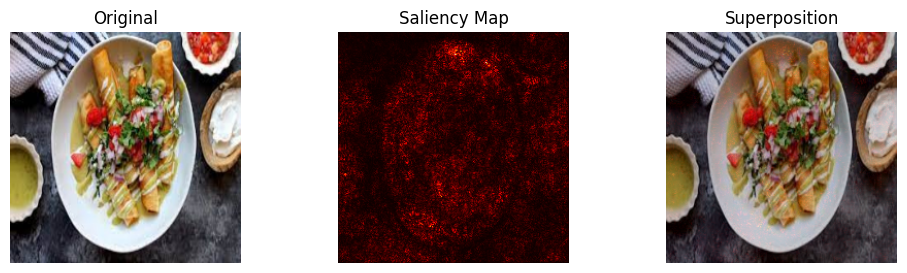

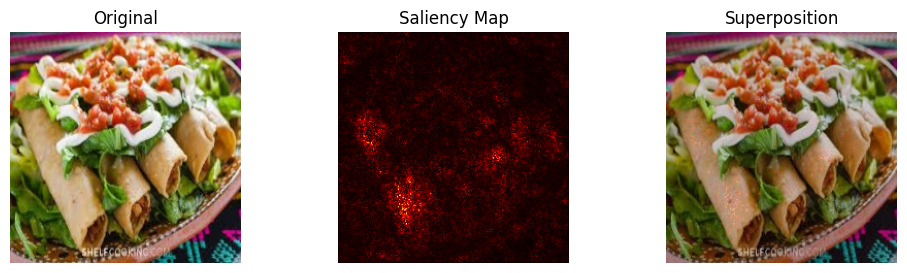

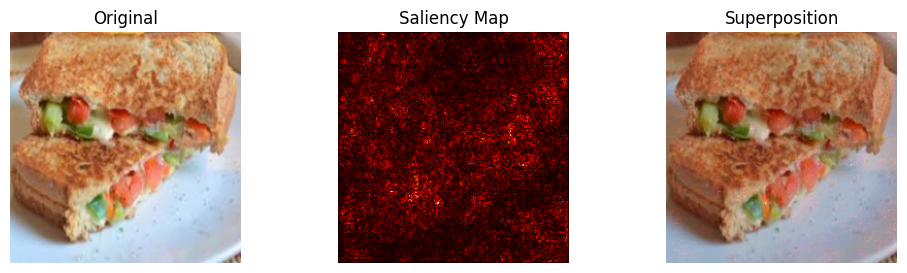

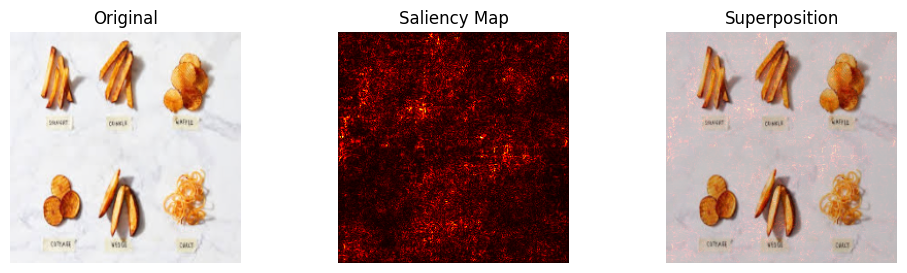

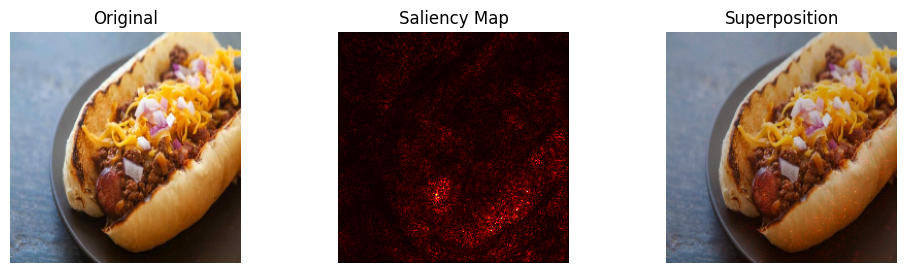

In [35]:
sm = SaliencyMAP(my_vgg16)

explain_predictions(sm, valid_loader, num_images = 5,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,3))

## Step 1: Baseline models - with data augmentation

Sebbene ConvNeXt si comporti un pochino meglio sul validation set, tutti e trei i modelli mostrano evidenti segni di overfitting, gia' dopo poche epoche. Tuttavia, possiamo provare a raggiungere performances migliori regolarizzando la rete, sfruttando la data augmentation.

In particolare, il validation set (e poi il test set!) manterranno delle trasformazioni di base, mentre il train set verra' reso piu' sfidante con delle trasformazioni.

In [36]:
augments = A.Compose([
    A.Resize(RESIZE_DIM, RESIZE_DIM),
    A.Normalize(mean = MEAN_RGB, std = STD_RGB),
    A.RandomRotate90(),
    A.HorizontalFlip(),
    A.VerticalFlip(),
    A.OneOf([A.Affine(shear = 20), A.Affine(scale = 1.2)],
             p = 0.6),
    A.Transpose(),
    ToTensorV2()])

train_dataset = torchvision.datasets.ImageFolder(train_path,
                                                 transform = Transforms(augments))
valid_dataset = torchvision.datasets.ImageFolder(valid_path,
                                                 transform = Transforms(baseline_transforms))

subset_train_dataset = create_subset(train_dataset, keeps_only_train)
subset_valid_dataset = create_subset(valid_dataset, keeps_only_val)

train_loader = data_utils.DataLoader(subset_train_dataset, batch_size = 128, shuffle = True,
                                     num_workers = 2, pin_memory = True)
valid_loader = data_utils.DataLoader(subset_valid_dataset, batch_size = 128, shuffle = False,
                                     num_workers = 2, pin_memory = True)

### EfficientNet

100%|██████████| 50/50 [02:57<00:00,  3.56s/it]


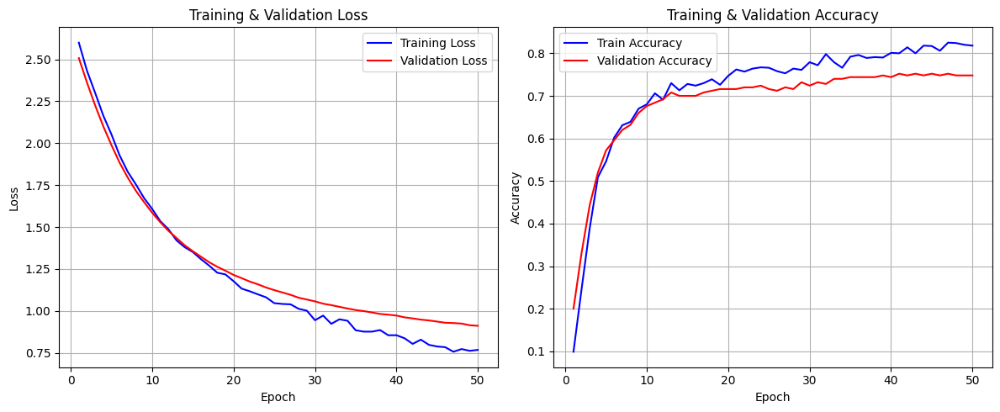

In [37]:
my_efficientnet = BaselineModel(backbone = efficientnet_full.features,
                                N_f = N_f_efficientnet).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_efficientnet.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_efficientnet, loss_fn, optimizer,
                                     train_loader, valid_loader,
                                     epochs = EPOCHS, verbose = False,
                                     confusion_matrix_data = True,
                                     early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.848,0.847915,0.850167,0.847977
Validation/Test,0.748,0.745290,0.750517,0.748366


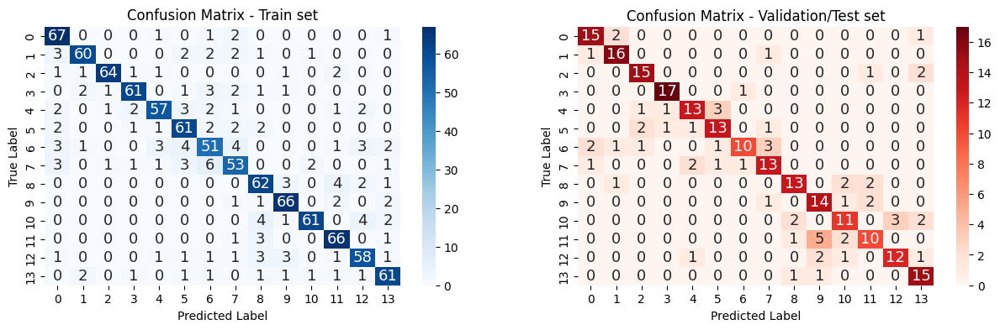

In [38]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

In [39]:
sm = SaliencyMAP(my_efficientnet)

explain_predictions(sm, valid_loader, num_images = 20,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,6))

Output hidden; open in https://colab.research.google.com to view.

### ConvNeXt

  2%|▏         | 1/50 [00:03<03:03,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 1
Train accuracy: 0.193  -------------- Valid accuracy: 0.368.
Train loss: 2.591  --------------   Valid loss: 2.494.


  4%|▍         | 2/50 [00:07<03:00,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 2
Train accuracy: 0.478  -------------- Valid accuracy: 0.608.
Train loss: 2.46  --------------   Valid loss: 2.35.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 3
Train accuracy: 0.616  -------------- Valid accuracy: 0.652.
Train loss: 2.34  --------------   Valid loss: 2.217.


  6%|▌         | 3/50 [00:11<02:56,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 4
Train accuracy: 0.675  -------------- Valid accuracy: 0.656.
Train loss: 2.234  --------------   Valid loss: 2.096.


  8%|▊         | 4/50 [00:15<02:52,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 5
Train accuracy: 0.712  -------------- Valid accuracy: 0.676.
Train loss: 2.12  --------------   Valid loss: 1.982.


 10%|█         | 5/50 [00:18<02:50,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 6
Train accuracy: 0.72  -------------- Valid accuracy: 0.72.
Train loss: 2.023  --------------   Valid loss: 1.879.


 12%|█▏        | 6/50 [00:22<02:47,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 7
Train accuracy: 0.74  -------------- Valid accuracy: 0.724.
Train loss: 1.95  --------------   Valid loss: 1.785.


 14%|█▍        | 7/50 [00:26<02:43,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 8
Train accuracy: 0.755  -------------- Valid accuracy: 0.736.
Train loss: 1.865  --------------   Valid loss: 1.698.


 16%|█▌        | 8/50 [00:30<02:40,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 9
Train accuracy: 0.749  -------------- Valid accuracy: 0.752.
Train loss: 1.786  --------------   Valid loss: 1.621.


 18%|█▊        | 9/50 [00:34<02:35,  3.79s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 10
Train accuracy: 0.767  -------------- Valid accuracy: 0.752.
Train loss: 1.713  --------------   Valid loss: 1.55.


 20%|██        | 10/50 [00:37<02:31,  3.79s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 11
Train accuracy: 0.765  -------------- Valid accuracy: 0.756.
Train loss: 1.644  --------------   Valid loss: 1.485.


 22%|██▏       | 11/50 [00:41<02:29,  3.83s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 12
Train accuracy: 0.771  -------------- Valid accuracy: 0.768.
Train loss: 1.601  --------------   Valid loss: 1.425.


 24%|██▍       | 12/50 [00:45<02:24,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 13
Train accuracy: 0.797  -------------- Valid accuracy: 0.764.
Train loss: 1.542  --------------   Valid loss: 1.372.


 26%|██▌       | 13/50 [00:49<02:20,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 14
Train accuracy: 0.776  -------------- Valid accuracy: 0.768.
Train loss: 1.483  --------------   Valid loss: 1.323.


 28%|██▊       | 14/50 [00:53<02:17,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 15
Train accuracy: 0.791  -------------- Valid accuracy: 0.768.
Train loss: 1.438  --------------   Valid loss: 1.277.


 30%|███       | 15/50 [00:56<02:13,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 16
Train accuracy: 0.782  -------------- Valid accuracy: 0.772.
Train loss: 1.403  --------------   Valid loss: 1.235.


 32%|███▏      | 16/50 [01:00<02:09,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 17
Train accuracy: 0.786  -------------- Valid accuracy: 0.768.
Train loss: 1.367  --------------   Valid loss: 1.198.


 34%|███▍      | 17/50 [01:04<02:05,  3.82s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 18
Train accuracy: 0.786  -------------- Valid accuracy: 0.768.
Train loss: 1.328  --------------   Valid loss: 1.163.


 36%|███▌      | 18/50 [01:08<02:01,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 19
Train accuracy: 0.791  -------------- Valid accuracy: 0.772.
Train loss: 1.292  --------------   Valid loss: 1.131.


 38%|███▊      | 19/50 [01:12<01:57,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 20
Train accuracy: 0.789  -------------- Valid accuracy: 0.768.
Train loss: 1.272  --------------   Valid loss: 1.101.


 40%|████      | 20/50 [01:16<01:56,  3.87s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 21
Train accuracy: 0.79  -------------- Valid accuracy: 0.772.
Train loss: 1.231  --------------   Valid loss: 1.073.


 42%|████▏     | 21/50 [01:19<01:51,  3.84s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 22
Train accuracy: 0.783  -------------- Valid accuracy: 0.78.
Train loss: 1.217  --------------   Valid loss: 1.047.


 44%|████▍     | 22/50 [01:23<01:46,  3.82s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 23
Train accuracy: 0.815  -------------- Valid accuracy: 0.78.
Train loss: 1.177  --------------   Valid loss: 1.023.


 46%|████▌     | 23/50 [01:27<01:43,  3.83s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 24
Train accuracy: 0.808  -------------- Valid accuracy: 0.788.
Train loss: 1.156  --------------   Valid loss: 1.002.


 48%|████▊     | 24/50 [01:31<01:39,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 25
Train accuracy: 0.798  -------------- Valid accuracy: 0.78.
Train loss: 1.128  --------------   Valid loss: 0.981.


 52%|█████▏    | 26/50 [01:38<01:30,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 26
Train accuracy: 0.808  -------------- Valid accuracy: 0.792.
Train loss: 1.103  --------------   Valid loss: 0.962.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 27
Train accuracy: 0.819  -------------- Valid accuracy: 0.788.
Train loss: 1.083  --------------   Valid loss: 0.944.


 54%|█████▍    | 27/50 [01:42<01:26,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 28
Train accuracy: 0.793  -------------- Valid accuracy: 0.78.
Train loss: 1.075  --------------   Valid loss: 0.927.


 58%|█████▊    | 29/50 [01:50<01:18,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 29
Train accuracy: 0.798  -------------- Valid accuracy: 0.78.
Train loss: 1.063  --------------   Valid loss: 0.911.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 30
Train accuracy: 0.823  -------------- Valid accuracy: 0.784.
Train loss: 1.028  --------------   Valid loss: 0.896.


 60%|██████    | 30/50 [01:53<01:15,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 31
Train accuracy: 0.811  -------------- Valid accuracy: 0.788.
Train loss: 1.017  --------------   Valid loss: 0.88.


 62%|██████▏   | 31/50 [01:57<01:11,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 32
Train accuracy: 0.811  -------------- Valid accuracy: 0.784.
Train loss: 1.003  --------------   Valid loss: 0.868.


 66%|██████▌   | 33/50 [02:05<01:03,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 33
Train accuracy: 0.822  -------------- Valid accuracy: 0.796.
Train loss: 0.991  --------------   Valid loss: 0.854.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 34
Train accuracy: 0.816  -------------- Valid accuracy: 0.796.
Train loss: 0.955  --------------   Valid loss: 0.842.


 68%|██████▊   | 34/50 [02:08<00:59,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 35
Train accuracy: 0.835  -------------- Valid accuracy: 0.796.
Train loss: 0.927  --------------   Valid loss: 0.83.


 70%|███████   | 35/50 [02:12<00:56,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 36
Train accuracy: 0.826  -------------- Valid accuracy: 0.8.
Train loss: 0.923  --------------   Valid loss: 0.817.


 72%|███████▏  | 36/50 [02:16<00:52,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 37
Train accuracy: 0.844  -------------- Valid accuracy: 0.8.
Train loss: 0.912  --------------   Valid loss: 0.807.


 74%|███████▍  | 37/50 [02:20<00:48,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 38
Train accuracy: 0.822  -------------- Valid accuracy: 0.796.
Train loss: 0.92  --------------   Valid loss: 0.797.


 76%|███████▌  | 38/50 [02:23<00:45,  3.78s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 39
Train accuracy: 0.828  -------------- Valid accuracy: 0.8.
Train loss: 0.901  --------------   Valid loss: 0.786.


 78%|███████▊  | 39/50 [02:27<00:41,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 40
Train accuracy: 0.841  -------------- Valid accuracy: 0.816.
Train loss: 0.864  --------------   Valid loss: 0.777.


 82%|████████▏ | 41/50 [02:35<00:34,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 41
Train accuracy: 0.843  -------------- Valid accuracy: 0.812.
Train loss: 0.874  --------------   Valid loss: 0.769.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 42
Train accuracy: 0.859  -------------- Valid accuracy: 0.812.
Train loss: 0.853  --------------   Valid loss: 0.76.


 86%|████████▌ | 43/50 [02:42<00:26,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 43
Train accuracy: 0.842  -------------- Valid accuracy: 0.816.
Train loss: 0.851  --------------   Valid loss: 0.752.


 88%|████████▊ | 44/50 [02:46<00:22,  3.80s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 44
Train accuracy: 0.841  -------------- Valid accuracy: 0.816.
Train loss: 0.836  --------------   Valid loss: 0.745.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 45
Train accuracy: 0.844  -------------- Valid accuracy: 0.816.
Train loss: 0.817  --------------   Valid loss: 0.738.


 90%|█████████ | 45/50 [02:50<00:19,  3.81s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 46
Train accuracy: 0.839  -------------- Valid accuracy: 0.816.
Train loss: 0.803  --------------   Valid loss: 0.729.


 92%|█████████▏| 46/50 [02:54<00:15,  3.84s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 47
Train accuracy: 0.838  -------------- Valid accuracy: 0.816.
Train loss: 0.806  --------------   Valid loss: 0.724.


 94%|█████████▍| 47/50 [02:58<00:11,  3.84s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 48
Train accuracy: 0.858  -------------- Valid accuracy: 0.812.
Train loss: 0.798  --------------   Valid loss: 0.717.


 96%|█████████▌| 48/50 [03:02<00:07,  3.82s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 49
Train accuracy: 0.849  -------------- Valid accuracy: 0.812.
Train loss: 0.776  --------------   Valid loss: 0.711.


 98%|█████████▊| 49/50 [03:05<00:03,  3.82s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 50
Train accuracy: 0.856  -------------- Valid accuracy: 0.82.
Train loss: 0.773  --------------   Valid loss: 0.705.


100%|██████████| 50/50 [03:09<00:00,  3.79s/it]


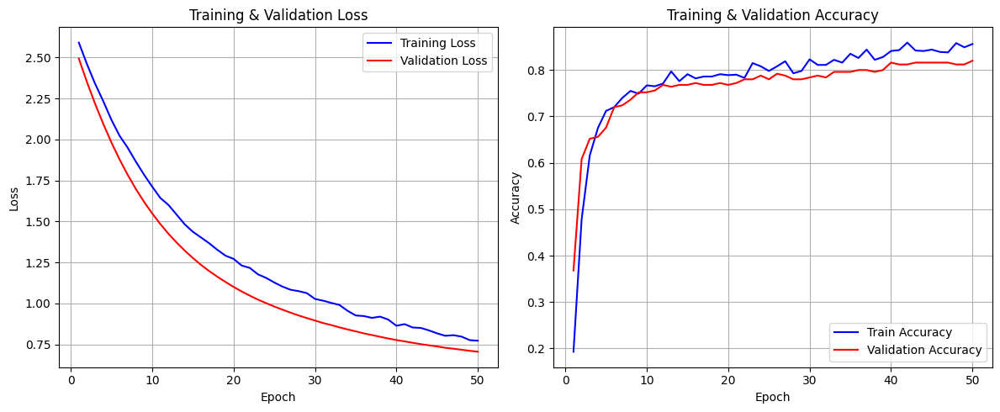

In [40]:
my_convnext = BaselineModel(backbone = convnext_full.features,
                            N_f = N_f_convnext).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_convnext.parameters(), lr = 0.001)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_convnext, loss_fn, optimizer,
                                      train_loader, valid_loader,
                                      epochs = EPOCHS, verbose = True,
                                      confusion_matrix_data = True,
                                      early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.863,0.863739,0.867443,0.863053
Validation/Test,0.820,0.819436,0.837847,0.820728


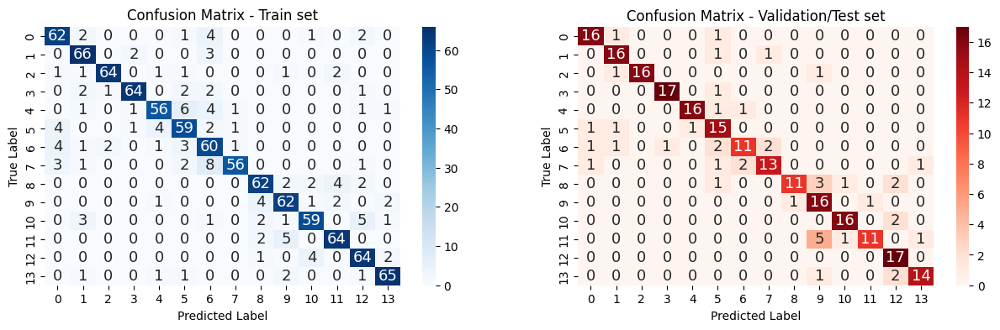

In [41]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

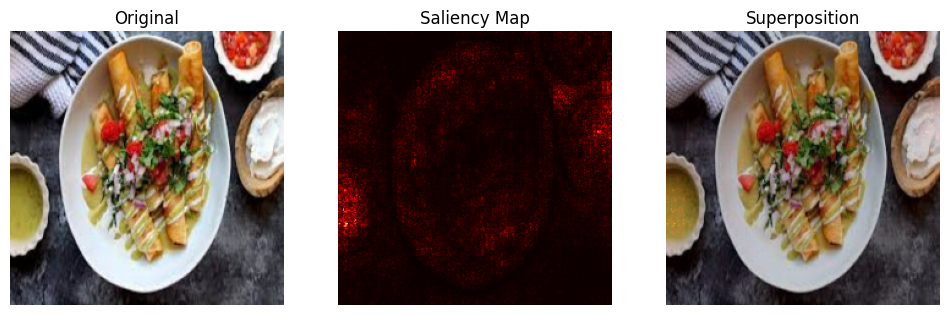

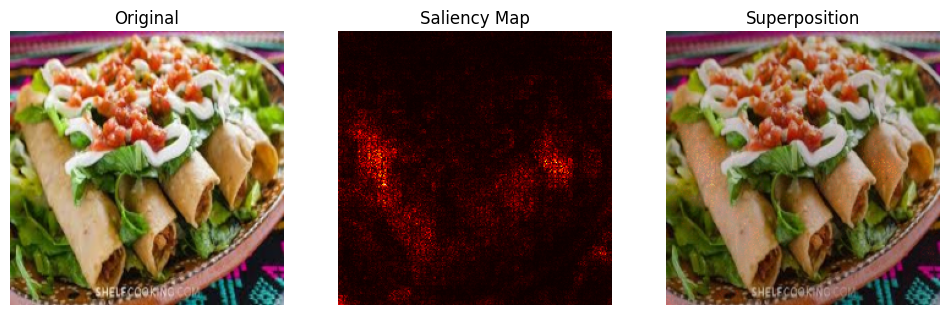

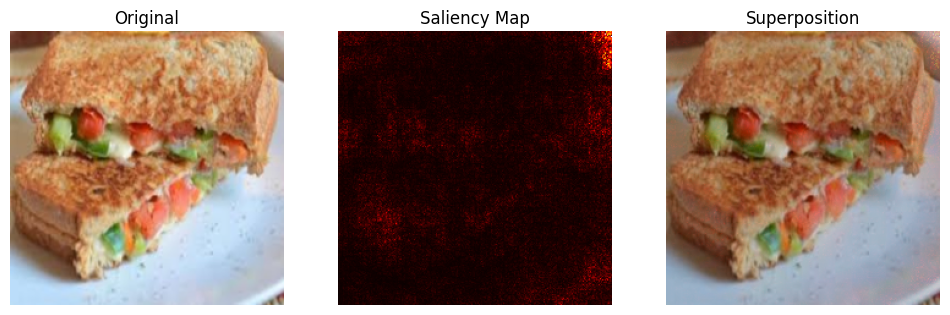

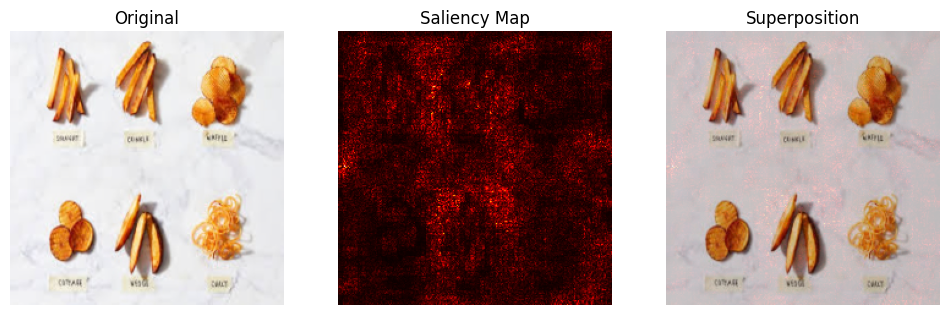

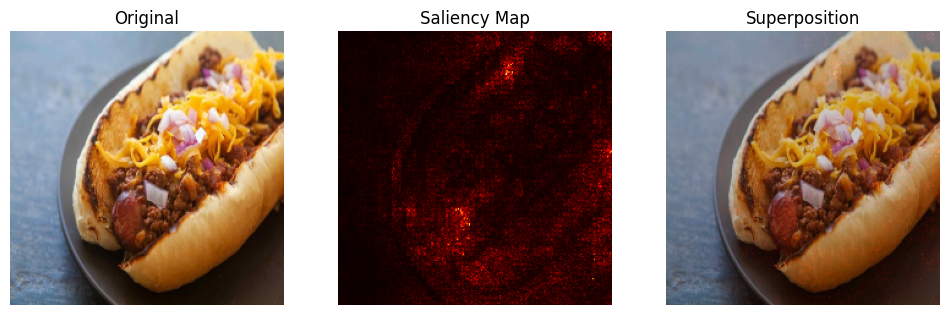

In [42]:
sm = SaliencyMAP(my_convnext)

explain_predictions(sm, valid_loader, num_images = 5,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,6))

### VGG16

100%|██████████| 50/50 [03:01<00:00,  3.63s/it]


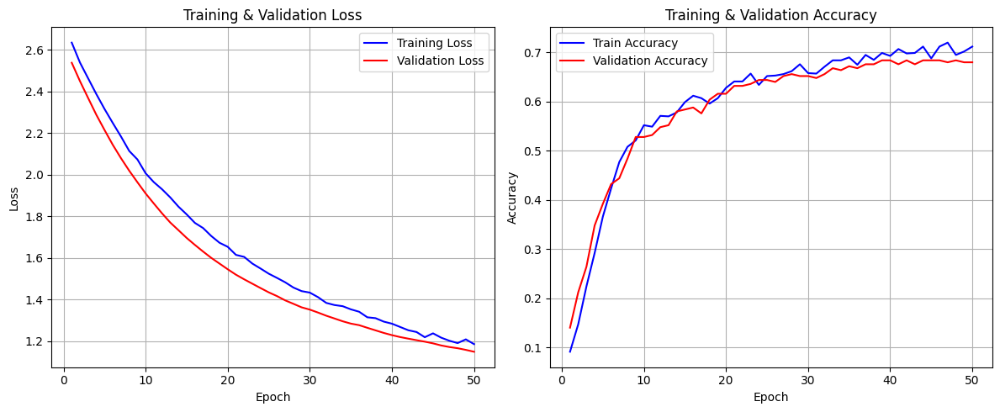

In [43]:
my_vgg16 = BaselineModel(backbone = vgg16_full.features,
                         N_f = N_f_vgg16).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_vgg16.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_vgg16, loss_fn, optimizer,
                                      train_loader, valid_loader,
                                      epochs = EPOCHS, verbose = False,
                                      confusion_matrix_data = True,
                                      early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.708,0.707618,0.711669,0.707928
Validation/Test,0.680,0.678126,0.691176,0.680672


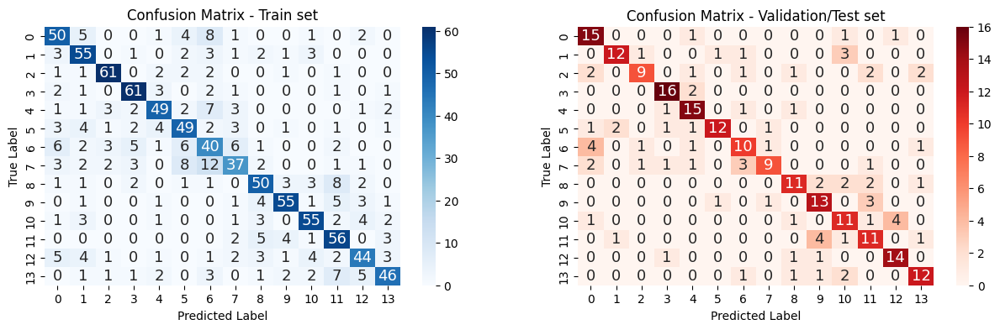

In [44]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

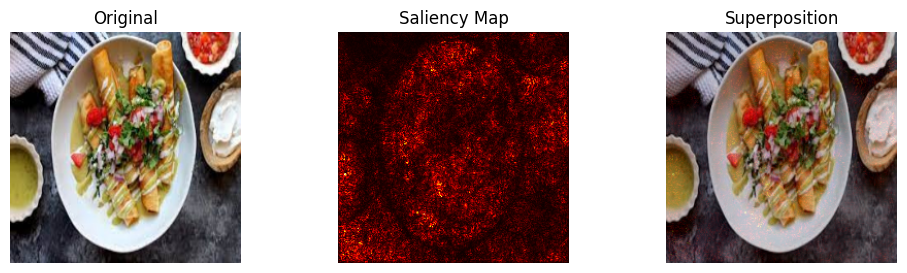

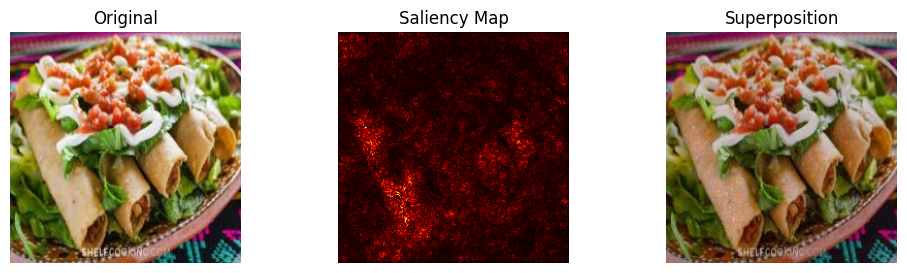

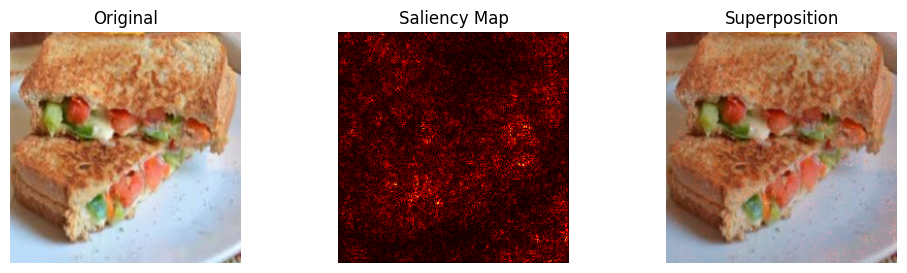

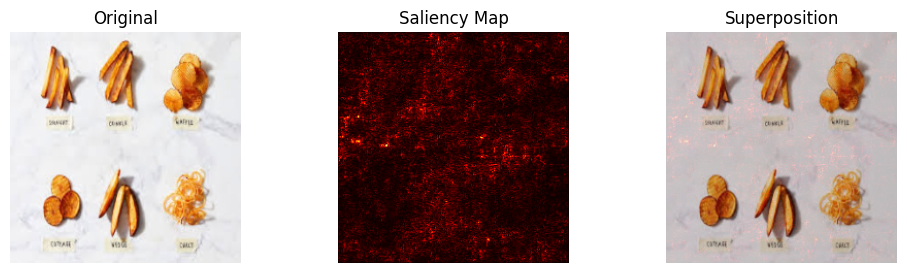

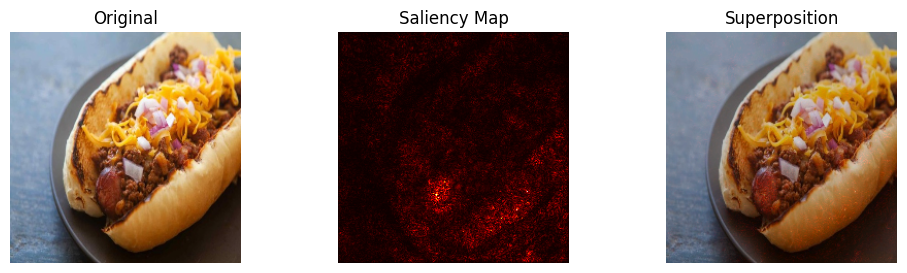

In [45]:
sm = SaliencyMAP(my_vgg16)

explain_predictions(sm, valid_loader, num_images = 5,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,3))

### ResNet

Visto che il modello medio riesce meglio degli altri, proviamo un altro modello famoso di dimensioni medie. Dato che il modello non contiene un `.features` andra' trattato in modo leggermente diverso per essere paragonato con gli altri:

100%|██████████| 50/50 [03:01<00:00,  3.63s/it]


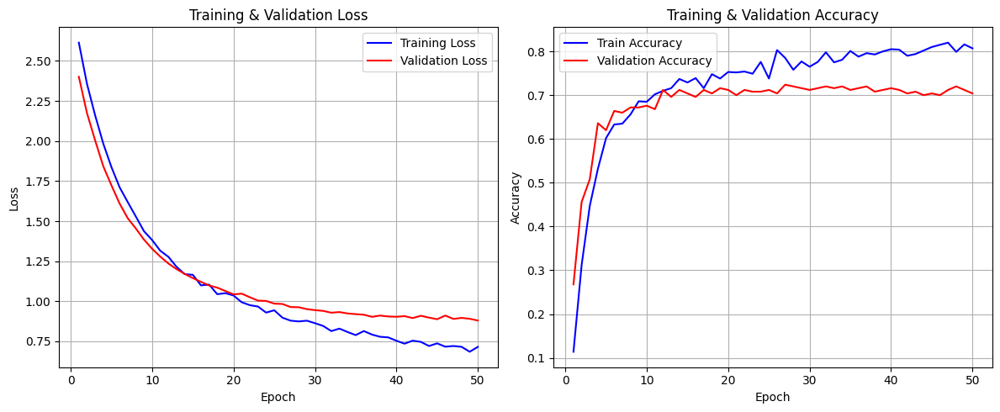

In [46]:
# modify the number of output neurons for our problem
resnet_full.fc = nn.Linear(resnet_full.fc.in_features, 14)
resnet_full.to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = resnet_full.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(resnet_full, loss_fn, optimizer,
                                      train_loader, valid_loader,
                                      epochs = EPOCHS, verbose = False,
                                      confusion_matrix_data = True,
                                      early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (12, 5))

,Accuracy,F1-score,Precision,Recall
Train,0.818,0.81844,0.821850,0.818005
Validation/Test,0.704,0.70392,0.715092,0.704715


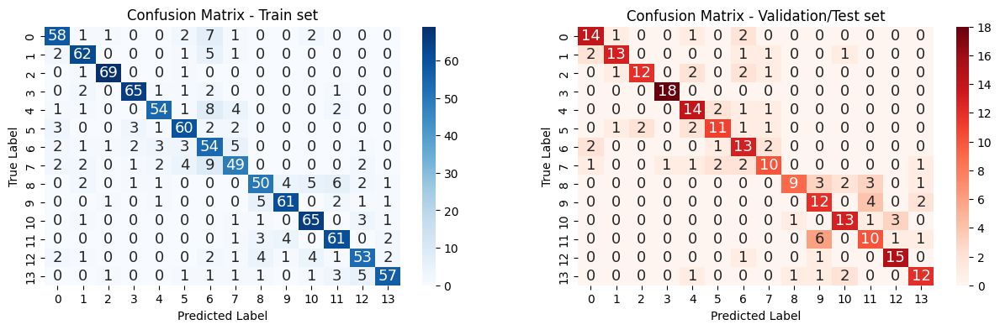

In [47]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 4))

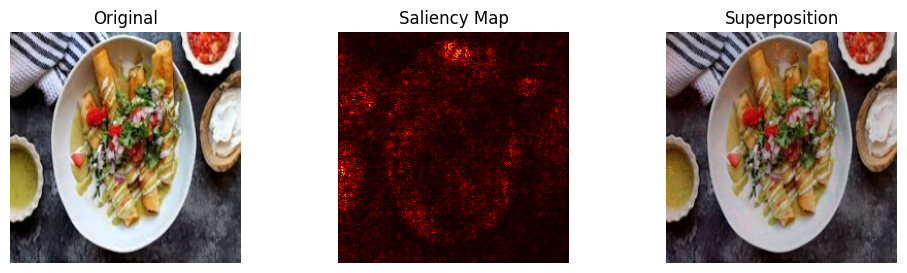

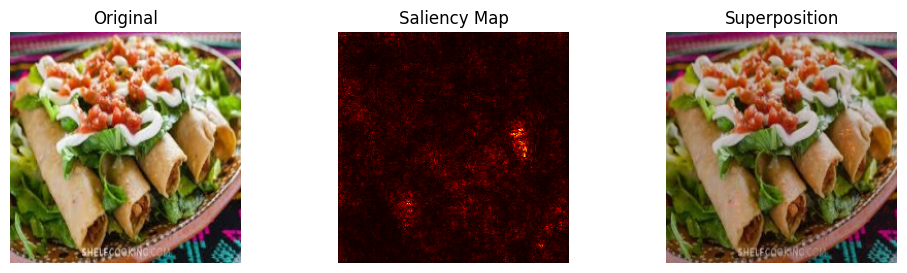

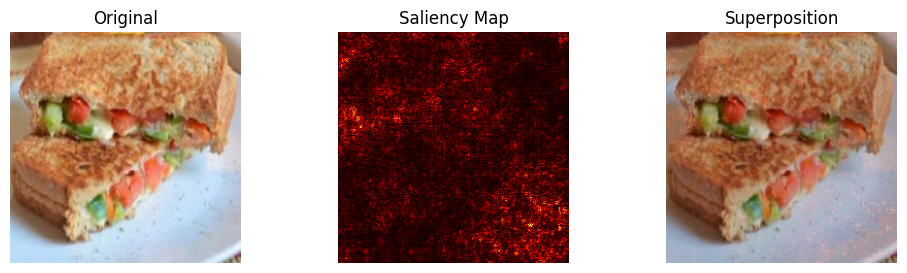

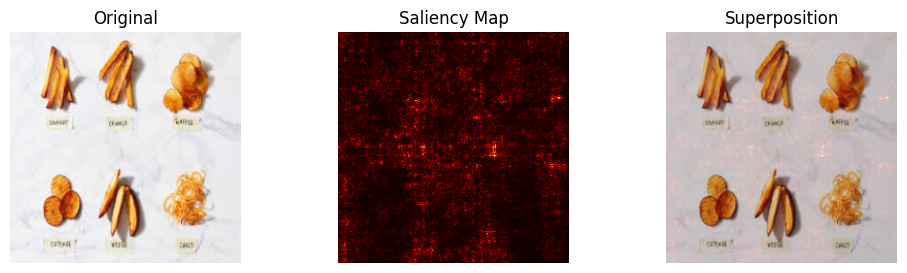

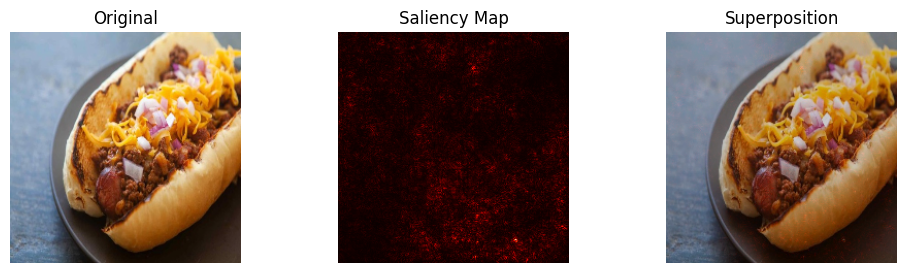

In [48]:
sm = SaliencyMAP(resnet_full)

explain_predictions(sm, valid_loader, num_images = 5,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,3))

## Improving performances

D'ora in poi verra' utilizzato ConvNeXt perche' fra i quattro e' quello che overfitta meno, raggiunge accuracies piu' alte sul validation set (80% circa), e dall'analisi delle saliency maps sembra quello che si focalizza meglio sulle features rilevanti. Inoltre fa pochi errori anche su classi molto simili (come 6 e 7, cioe' 'taco' e 'taquito'). Possiamo quindi provare ad usare una testa di classificazione piu' complicata. Il rischio, ovviamente, e' di finire nuovamente con overfitting. Questo perche' i modelli allenati su ImageNet sono gia' estremamente potenti (cioe' capaci di riconoscere features per 1000 classi), e quindi aggiungere parametri potrebbe dare una complessita' al modello non necessaria.

In [49]:
class EnlargedModel(nn.Module):
  """
    backbone: a nn.Module, which extracts the features;
    N_f: the number of feature maps in output of the backbone
    """
  def __init__(self, backbone: nn.Module, N_f):
    super().__init__()
    self.features = backbone
    self.N_f = N_f
    self.classification_head = nn.Sequential(
        nn.AdaptiveAvgPool2d((1, 1)), # X.shape: [B, N_f, 1, 1]
        nn.Flatten(), # X.shape: [B, N_f]
        nn.Linear(self.N_f, 50),
        nn.BatchNorm1d(50),
        nn.ReLU(),
        nn.Dropout(p = 0.5),
        nn.Linear(50, 25),
        nn.BatchNorm1d(25),
        nn.ReLU(),
        nn.Dropout(p = 0.5),
        nn.Linear(25, 14)) # X.shape: [B, 2]

  def forward(self, X): # X.shape: [B, C = 3, RESIZE_DIM, RESIZE_DIM]
    X = self.features(X)  # X.shape: [B, N_f, ..., ...]
    X = self.classification_head(X) # X.shape: [B, 2]
    return X

  2%|▏         | 1/50 [00:03<03:02,  3.72s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 1
Train accuracy: 0.088  -------------- Valid accuracy: 0.104.
Train loss: 2.755  --------------   Valid loss: 2.635.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 2
Train accuracy: 0.114  -------------- Valid accuracy: 0.148.
Train loss: 2.634  --------------   Valid loss: 2.616.


  4%|▍         | 2/50 [00:07<03:04,  3.84s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 3
Train accuracy: 0.162  -------------- Valid accuracy: 0.248.
Train loss: 2.534  --------------   Valid loss: 2.572.


  6%|▌         | 3/50 [00:11<02:57,  3.79s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 4
Train accuracy: 0.177  -------------- Valid accuracy: 0.34.
Train loss: 2.463  --------------   Valid loss: 2.492.


  8%|▊         | 4/50 [00:15<02:53,  3.78s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 5
Train accuracy: 0.196  -------------- Valid accuracy: 0.412.
Train loss: 2.436  --------------   Valid loss: 2.385.


 10%|█         | 5/50 [00:18<02:49,  3.77s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 6
Train accuracy: 0.235  -------------- Valid accuracy: 0.448.
Train loss: 2.387  --------------   Valid loss: 2.281.


 12%|█▏        | 6/50 [00:22<02:45,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 7
Train accuracy: 0.236  -------------- Valid accuracy: 0.488.
Train loss: 2.332  --------------   Valid loss: 2.189.


 14%|█▍        | 7/50 [00:26<02:41,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 8
Train accuracy: 0.267  -------------- Valid accuracy: 0.516.
Train loss: 2.313  --------------   Valid loss: 2.104.


 16%|█▌        | 8/50 [00:30<02:37,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 9
Train accuracy: 0.266  -------------- Valid accuracy: 0.54.
Train loss: 2.285  --------------   Valid loss: 2.055.


 18%|█▊        | 9/50 [00:33<02:33,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 10
Train accuracy: 0.287  -------------- Valid accuracy: 0.588.
Train loss: 2.265  --------------   Valid loss: 2.022.


 22%|██▏       | 11/50 [00:41<02:26,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 11
Train accuracy: 0.294  -------------- Valid accuracy: 0.576.
Train loss: 2.222  --------------   Valid loss: 1.987.


 24%|██▍       | 12/50 [00:45<02:22,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 12
Train accuracy: 0.316  -------------- Valid accuracy: 0.608.
Train loss: 2.17  --------------   Valid loss: 1.951.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 13
Train accuracy: 0.331  -------------- Valid accuracy: 0.608.
Train loss: 2.156  --------------   Valid loss: 1.914.


 28%|██▊       | 14/50 [00:52<02:14,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 14
Train accuracy: 0.351  -------------- Valid accuracy: 0.64.
Train loss: 2.138  --------------   Valid loss: 1.894.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 15
Train accuracy: 0.367  -------------- Valid accuracy: 0.652.
Train loss: 2.087  --------------   Valid loss: 1.871.


 30%|███       | 15/50 [00:56<02:11,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 16
Train accuracy: 0.374  -------------- Valid accuracy: 0.644.
Train loss: 2.087  --------------   Valid loss: 1.848.


 34%|███▍      | 17/50 [01:03<02:03,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 17
Train accuracy: 0.364  -------------- Valid accuracy: 0.688.
Train loss: 2.078  --------------   Valid loss: 1.816.


 36%|███▌      | 18/50 [01:07<01:59,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 18
Train accuracy: 0.39  -------------- Valid accuracy: 0.696.
Train loss: 2.039  --------------   Valid loss: 1.801.


 38%|███▊      | 19/50 [01:11<01:55,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 19
Train accuracy: 0.393  -------------- Valid accuracy: 0.724.
Train loss: 2.021  --------------   Valid loss: 1.769.


 40%|████      | 20/50 [01:15<01:52,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 20
Train accuracy: 0.427  -------------- Valid accuracy: 0.724.
Train loss: 1.955  --------------   Valid loss: 1.761.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 21
Train accuracy: 0.417  -------------- Valid accuracy: 0.724.
Train loss: 1.986  --------------   Valid loss: 1.724.


 44%|████▍     | 22/50 [01:22<01:44,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 22
Train accuracy: 0.425  -------------- Valid accuracy: 0.744.
Train loss: 1.938  --------------   Valid loss: 1.689.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 23
Train accuracy: 0.456  -------------- Valid accuracy: 0.748.
Train loss: 1.909  --------------   Valid loss: 1.664.


 46%|████▌     | 23/50 [01:26<01:41,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 24
Train accuracy: 0.45  -------------- Valid accuracy: 0.736.
Train loss: 1.889  --------------   Valid loss: 1.633.


 50%|█████     | 25/50 [01:33<01:33,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 25
Train accuracy: 0.43  -------------- Valid accuracy: 0.74.
Train loss: 1.904  --------------   Valid loss: 1.606.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 26
Train accuracy: 0.43  -------------- Valid accuracy: 0.748.
Train loss: 1.878  --------------   Valid loss: 1.584.


 54%|█████▍    | 27/50 [01:41<01:26,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 27
Train accuracy: 0.492  -------------- Valid accuracy: 0.756.
Train loss: 1.811  --------------   Valid loss: 1.564.


 56%|█████▌    | 28/50 [01:44<01:22,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 28
Train accuracy: 0.49  -------------- Valid accuracy: 0.772.
Train loss: 1.805  --------------   Valid loss: 1.545.


 58%|█████▊    | 29/50 [01:48<01:18,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 29
Train accuracy: 0.464  -------------- Valid accuracy: 0.772.
Train loss: 1.792  --------------   Valid loss: 1.523.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 30
Train accuracy: 0.466  -------------- Valid accuracy: 0.788.
Train loss: 1.789  --------------   Valid loss: 1.51.


 62%|██████▏   | 31/50 [01:56<01:10,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 31
Train accuracy: 0.494  -------------- Valid accuracy: 0.784.
Train loss: 1.736  --------------   Valid loss: 1.489.


 64%|██████▍   | 32/50 [01:59<01:07,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 32
Train accuracy: 0.514  -------------- Valid accuracy: 0.784.
Train loss: 1.723  --------------   Valid loss: 1.468.


 66%|██████▌   | 33/50 [02:03<01:03,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 33
Train accuracy: 0.513  -------------- Valid accuracy: 0.788.
Train loss: 1.681  --------------   Valid loss: 1.444.


 68%|██████▊   | 34/50 [02:07<00:59,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 34
Train accuracy: 0.512  -------------- Valid accuracy: 0.788.
Train loss: 1.676  --------------   Valid loss: 1.414.


 70%|███████   | 35/50 [02:11<00:55,  3.73s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 35
Train accuracy: 0.52  -------------- Valid accuracy: 0.78.
Train loss: 1.661  --------------   Valid loss: 1.389.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 36
Train accuracy: 0.534  -------------- Valid accuracy: 0.78.
Train loss: 1.65  --------------   Valid loss: 1.362.


 74%|███████▍  | 37/50 [02:18<00:48,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 37
Train accuracy: 0.496  -------------- Valid accuracy: 0.788.
Train loss: 1.659  --------------   Valid loss: 1.345.


 76%|███████▌  | 38/50 [02:22<00:44,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 38
Train accuracy: 0.526  -------------- Valid accuracy: 0.792.
Train loss: 1.61  --------------   Valid loss: 1.329.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 39
Train accuracy: 0.533  -------------- Valid accuracy: 0.804.
Train loss: 1.605  --------------   Valid loss: 1.313.


 78%|███████▊  | 39/50 [02:26<00:41,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 40
Train accuracy: 0.538  -------------- Valid accuracy: 0.8.
Train loss: 1.591  --------------   Valid loss: 1.297.


 82%|████████▏ | 41/50 [02:33<00:33,  3.76s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 41
Train accuracy: 0.51  -------------- Valid accuracy: 0.804.
Train loss: 1.617  --------------   Valid loss: 1.258.


 84%|████████▍ | 42/50 [02:37<00:29,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 42
Train accuracy: 0.506  -------------- Valid accuracy: 0.82.
Train loss: 1.583  --------------   Valid loss: 1.235.


 86%|████████▌ | 43/50 [02:41<00:26,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 43
Train accuracy: 0.539  -------------- Valid accuracy: 0.82.
Train loss: 1.531  --------------   Valid loss: 1.234.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 44
Train accuracy: 0.566  -------------- Valid accuracy: 0.824.
Train loss: 1.525  --------------   Valid loss: 1.214.


 88%|████████▊ | 44/50 [02:44<00:22,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 45
Train accuracy: 0.534  -------------- Valid accuracy: 0.82.
Train loss: 1.57  --------------   Valid loss: 1.201.


 90%|█████████ | 45/50 [02:48<00:18,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 46
Train accuracy: 0.551  -------------- Valid accuracy: 0.824.
Train loss: 1.497  --------------   Valid loss: 1.188.


 94%|█████████▍| 47/50 [02:56<00:11,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 47
Train accuracy: 0.571  -------------- Valid accuracy: 0.812.
Train loss: 1.487  --------------   Valid loss: 1.171.


 96%|█████████▌| 48/50 [02:59<00:07,  3.74s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 48
Train accuracy: 0.557  -------------- Valid accuracy: 0.816.
Train loss: 1.454  --------------   Valid loss: 1.143.


 98%|█████████▊| 49/50 [03:03<00:03,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 49
Train accuracy: 0.568  -------------- Valid accuracy: 0.816.
Train loss: 1.444  --------------   Valid loss: 1.13.


100%|██████████| 50/50 [03:07<00:00,  3.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 50
Train accuracy: 0.563  -------------- Valid accuracy: 0.804.
Train loss: 1.476  --------------   Valid loss: 1.121.


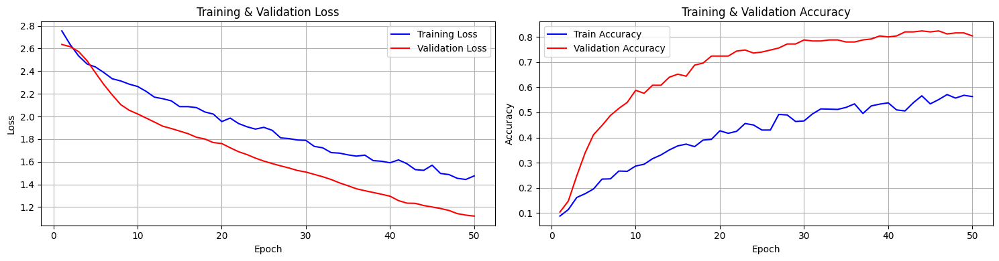

In [50]:
my_convnext = EnlargedModel(backbone = convnext_full.features,
                                N_f = N_f_convnext).to(device)

EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_convnext.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './enlarged_checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_convnext, loss_fn, optimizer,
                                     train_loader, valid_loader,
                                     epochs = EPOCHS, verbose = True,
                                     confusion_matrix_data = True,
                                     early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (15, 4))

,Accuracy,F1-score,Precision,Recall
Train,0.902,0.901914,0.905519,0.901953
Validation/Test,0.804,0.801317,0.815603,0.804388


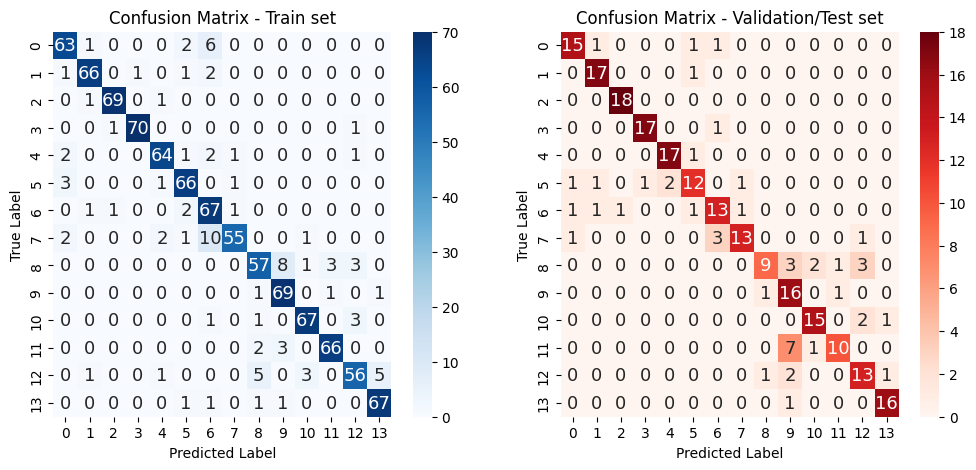

In [51]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (12, 5))

In [52]:
sm = SaliencyMAP(my_convnext)

explain_predictions(sm, valid_loader, num_images = 30,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,6))

Output hidden; open in https://colab.research.google.com to view.

## Final test and discussion

Da notare come ConvNeXt con e senza testa di classificazione piu' complessa raggiungano praticamente gli stessi risultati sul validation set, mentre il modello con la testa di classificazione raggiunga prestazioni molto piu' elevate sul training set, segno che il modello sta imparando solamente a riprodurre i dati senza capirli di piu'. Avendo identificato quindi il miglior modello (che e' ConvNeXt con augmentation ma con la testa di classificazione semplice per evitare appunto overfitting ulteriore) possiamo procedere verso il test finale, usando i train-validation sets completi e poi finalmente il test set. Dato che il resto dell'analisi e' stata '''molto veloce''', spendiamo ora tutte le risorse possibili per fare training e test. Per questo motivo, si lascia trainare il modello a lungo, lasciando eventualmente intervenire l'EarlyStopping ove necessario.

### Train-validation

In [54]:
train_dataset = torchvision.datasets.ImageFolder(train_path,
                                                 transform = Transforms(augments))
valid_dataset = torchvision.datasets.ImageFolder(valid_path,
                                                 transform = Transforms(baseline_transforms))
test_dataset = torchvision.datasets.ImageFolder(test_path,
                                                 transform = Transforms(baseline_transforms))

train_loader = data_utils.DataLoader(train_dataset, batch_size = 128, shuffle = True,
                                     num_workers = 2, pin_memory = True)
valid_loader = data_utils.DataLoader(valid_dataset, batch_size = 128, shuffle = False,
                                     num_workers = 2, pin_memory = True)
test_loader = data_utils.DataLoader(test_dataset, batch_size = 128, shuffle = False,
                                    num_workers = 2, pin_memory = True)

  0%|          | 1/250 [00:31<2:12:12, 31.86s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 1
Train accuracy: 0.485  -------------- Valid accuracy: 0.734.
Train loss: 2.398  --------------   Valid loss: 2.061.


  1%|          | 2/250 [00:57<1:57:24, 28.40s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 2
Train accuracy: 0.716  -------------- Valid accuracy: 0.779.
Train loss: 1.976  --------------   Valid loss: 1.656.


  1%|          | 3/250 [01:23<1:51:55, 27.19s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 3
Train accuracy: 0.751  -------------- Valid accuracy: 0.799.
Train loss: 1.682  --------------   Valid loss: 1.383.


  2%|▏         | 4/250 [01:49<1:49:19, 26.67s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 4
Train accuracy: 0.755  -------------- Valid accuracy: 0.804.
Train loss: 1.477  --------------   Valid loss: 1.196.


  2%|▏         | 5/250 [02:15<1:47:34, 26.35s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 5
Train accuracy: 0.764  -------------- Valid accuracy: 0.811.
Train loss: 1.318  --------------   Valid loss: 1.061.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 6
Train accuracy: 0.774  -------------- Valid accuracy: 0.815.
Train loss: 1.204  --------------   Valid loss: 0.961.


  3%|▎         | 7/250 [03:06<1:45:24, 26.03s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 7
Train accuracy: 0.777  -------------- Valid accuracy: 0.822.
Train loss: 1.12  --------------   Valid loss: 0.885.


  3%|▎         | 8/250 [03:32<1:44:42, 25.96s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 8
Train accuracy: 0.789  -------------- Valid accuracy: 0.824.
Train loss: 1.046  --------------   Valid loss: 0.826.


  4%|▎         | 9/250 [03:58<1:44:03, 25.91s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 9
Train accuracy: 0.789  -------------- Valid accuracy: 0.831.
Train loss: 0.986  --------------   Valid loss: 0.777.


  4%|▍         | 10/250 [04:24<1:43:16, 25.82s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 10
Train accuracy: 0.796  -------------- Valid accuracy: 0.83.
Train loss: 0.941  --------------   Valid loss: 0.738.


  4%|▍         | 11/250 [04:49<1:42:34, 25.75s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 11
Train accuracy: 0.797  -------------- Valid accuracy: 0.833.
Train loss: 0.896  --------------   Valid loss: 0.705.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 12
Train accuracy: 0.803  -------------- Valid accuracy: 0.837.
Train loss: 0.858  --------------   Valid loss: 0.676.


  5%|▌         | 13/250 [05:40<1:41:22, 25.67s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 13
Train accuracy: 0.805  -------------- Valid accuracy: 0.842.
Train loss: 0.829  --------------   Valid loss: 0.652.


  6%|▌         | 14/250 [06:06<1:40:53, 25.65s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 14
Train accuracy: 0.81  -------------- Valid accuracy: 0.843.
Train loss: 0.804  --------------   Valid loss: 0.63.


  6%|▌         | 15/250 [06:31<1:40:16, 25.60s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 15
Train accuracy: 0.808  -------------- Valid accuracy: 0.844.
Train loss: 0.781  --------------   Valid loss: 0.613.


  6%|▋         | 16/250 [06:57<1:40:00, 25.64s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 16
Train accuracy: 0.818  -------------- Valid accuracy: 0.848.
Train loss: 0.75  --------------   Valid loss: 0.595.


  7%|▋         | 17/250 [07:23<1:39:41, 25.67s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 17
Train accuracy: 0.821  -------------- Valid accuracy: 0.849.
Train loss: 0.734  --------------   Valid loss: 0.58.


  7%|▋         | 18/250 [07:49<1:39:16, 25.67s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 18
Train accuracy: 0.82  -------------- Valid accuracy: 0.852.
Train loss: 0.718  --------------   Valid loss: 0.567.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 19
Train accuracy: 0.822  -------------- Valid accuracy: 0.853.
Train loss: 0.698  --------------   Valid loss: 0.555.


  8%|▊         | 19/250 [08:14<1:38:38, 25.62s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 20
Train accuracy: 0.827  -------------- Valid accuracy: 0.852.
Train loss: 0.681  --------------   Valid loss: 0.544.


  8%|▊         | 21/250 [09:05<1:37:51, 25.64s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 21
Train accuracy: 0.828  -------------- Valid accuracy: 0.857.
Train loss: 0.667  --------------   Valid loss: 0.533.


  9%|▉         | 22/250 [09:31<1:37:20, 25.62s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 22
Train accuracy: 0.83  -------------- Valid accuracy: 0.858.
Train loss: 0.656  --------------   Valid loss: 0.525.


  9%|▉         | 23/250 [09:56<1:36:43, 25.57s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 23
Train accuracy: 0.832  -------------- Valid accuracy: 0.859.
Train loss: 0.641  --------------   Valid loss: 0.516.


 10%|▉         | 24/250 [10:22<1:36:16, 25.56s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 24
Train accuracy: 0.829  -------------- Valid accuracy: 0.859.
Train loss: 0.639  --------------   Valid loss: 0.509.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 25
Train accuracy: 0.836  -------------- Valid accuracy: 0.863.
Train loss: 0.63  --------------   Valid loss: 0.501.


 10%|█         | 25/250 [10:47<1:35:43, 25.53s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 26
Train accuracy: 0.838  -------------- Valid accuracy: 0.862.
Train loss: 0.62  --------------   Valid loss: 0.494.


 11%|█         | 27/250 [11:39<1:34:55, 25.54s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 27
Train accuracy: 0.841  -------------- Valid accuracy: 0.864.
Train loss: 0.605  --------------   Valid loss: 0.487.


 11%|█         | 28/250 [12:04<1:34:23, 25.51s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 28
Train accuracy: 0.842  -------------- Valid accuracy: 0.867.
Train loss: 0.596  --------------   Valid loss: 0.481.


 12%|█▏        | 29/250 [12:29<1:33:50, 25.48s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 29
Train accuracy: 0.845  -------------- Valid accuracy: 0.864.
Train loss: 0.585  --------------   Valid loss: 0.477.


 12%|█▏        | 30/250 [12:55<1:33:26, 25.49s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 30
Train accuracy: 0.851  -------------- Valid accuracy: 0.866.
Train loss: 0.574  --------------   Valid loss: 0.471.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 31
Train accuracy: 0.846  -------------- Valid accuracy: 0.869.
Train loss: 0.577  --------------   Valid loss: 0.466.


 12%|█▏        | 31/250 [13:21<1:33:20, 25.57s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 32
Train accuracy: 0.848  -------------- Valid accuracy: 0.871.
Train loss: 0.566  --------------   Valid loss: 0.462.


 13%|█▎        | 33/250 [14:12<1:32:16, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 33
Train accuracy: 0.856  -------------- Valid accuracy: 0.871.
Train loss: 0.553  --------------   Valid loss: 0.458.


 14%|█▎        | 34/250 [14:37<1:31:52, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 34
Train accuracy: 0.846  -------------- Valid accuracy: 0.871.
Train loss: 0.554  --------------   Valid loss: 0.453.


 14%|█▍        | 35/250 [15:03<1:31:35, 25.56s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 35
Train accuracy: 0.85  -------------- Valid accuracy: 0.871.
Train loss: 0.546  --------------   Valid loss: 0.45.


 14%|█▍        | 36/250 [15:28<1:31:02, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 36
Train accuracy: 0.854  -------------- Valid accuracy: 0.871.
Train loss: 0.542  --------------   Valid loss: 0.445.


 15%|█▍        | 37/250 [15:54<1:30:32, 25.51s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 37
Train accuracy: 0.85  -------------- Valid accuracy: 0.872.
Train loss: 0.535  --------------   Valid loss: 0.442.


 15%|█▌        | 38/250 [16:19<1:30:05, 25.50s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 38
Train accuracy: 0.858  -------------- Valid accuracy: 0.872.
Train loss: 0.525  --------------   Valid loss: 0.438.


 16%|█▌        | 39/250 [16:45<1:29:48, 25.54s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 39
Train accuracy: 0.857  -------------- Valid accuracy: 0.875.
Train loss: 0.516  --------------   Valid loss: 0.435.


 16%|█▌        | 40/250 [17:10<1:29:22, 25.53s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 40
Train accuracy: 0.854  -------------- Valid accuracy: 0.874.
Train loss: 0.523  --------------   Valid loss: 0.432.


 16%|█▋        | 41/250 [17:36<1:29:03, 25.57s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 41
Train accuracy: 0.86  -------------- Valid accuracy: 0.874.
Train loss: 0.514  --------------   Valid loss: 0.429.


 17%|█▋        | 42/250 [18:01<1:28:29, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 42
Train accuracy: 0.856  -------------- Valid accuracy: 0.877.
Train loss: 0.512  --------------   Valid loss: 0.426.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 43
Train accuracy: 0.86  -------------- Valid accuracy: 0.875.
Train loss: 0.503  --------------   Valid loss: 0.424.


 17%|█▋        | 43/250 [18:27<1:28:15, 25.58s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 44
Train accuracy: 0.859  -------------- Valid accuracy: 0.876.
Train loss: 0.507  --------------   Valid loss: 0.421.


 18%|█▊        | 45/250 [19:18<1:27:06, 25.50s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 45
Train accuracy: 0.865  -------------- Valid accuracy: 0.877.
Train loss: 0.495  --------------   Valid loss: 0.419.


 18%|█▊        | 46/250 [19:43<1:26:35, 25.47s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 46
Train accuracy: 0.865  -------------- Valid accuracy: 0.876.
Train loss: 0.494  --------------   Valid loss: 0.417.


 19%|█▉        | 47/250 [20:09<1:26:07, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 47
Train accuracy: 0.866  -------------- Valid accuracy: 0.877.
Train loss: 0.49  --------------   Valid loss: 0.415.


 19%|█▉        | 48/250 [20:34<1:25:53, 25.51s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 48
Train accuracy: 0.863  -------------- Valid accuracy: 0.875.
Train loss: 0.485  --------------   Valid loss: 0.413.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 49
Train accuracy: 0.867  -------------- Valid accuracy: 0.877.
Train loss: 0.48  --------------   Valid loss: 0.41.


 20%|█▉        | 49/250 [21:00<1:25:31, 25.53s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 50
Train accuracy: 0.865  -------------- Valid accuracy: 0.879.
Train loss: 0.477  --------------   Valid loss: 0.408.


 20%|██        | 50/250 [21:25<1:24:55, 25.48s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 51
Train accuracy: 0.869  -------------- Valid accuracy: 0.879.
Train loss: 0.468  --------------   Valid loss: 0.406.


 21%|██        | 52/250 [22:16<1:24:01, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 52
Train accuracy: 0.869  -------------- Valid accuracy: 0.879.
Train loss: 0.467  --------------   Valid loss: 0.405.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 53
Train accuracy: 0.869  -------------- Valid accuracy: 0.877.
Train loss: 0.468  --------------   Valid loss: 0.403.


 21%|██        | 53/250 [22:42<1:23:34, 25.45s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 54
Train accuracy: 0.873  -------------- Valid accuracy: 0.879.
Train loss: 0.458  --------------   Valid loss: 0.401.


 22%|██▏       | 55/250 [23:33<1:22:51, 25.50s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 55
Train accuracy: 0.868  -------------- Valid accuracy: 0.88.
Train loss: 0.465  --------------   Valid loss: 0.4.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 56
Train accuracy: 0.87  -------------- Valid accuracy: 0.878.
Train loss: 0.46  --------------   Valid loss: 0.397.


 23%|██▎       | 57/250 [24:23<1:21:45, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 57
Train accuracy: 0.874  -------------- Valid accuracy: 0.881.
Train loss: 0.452  --------------   Valid loss: 0.397.


 23%|██▎       | 58/250 [24:49<1:21:15, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 58
Train accuracy: 0.869  -------------- Valid accuracy: 0.88.
Train loss: 0.453  --------------   Valid loss: 0.395.


 24%|██▎       | 59/250 [25:14<1:20:49, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 59
Train accuracy: 0.873  -------------- Valid accuracy: 0.88.
Train loss: 0.448  --------------   Valid loss: 0.393.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 60
Train accuracy: 0.871  -------------- Valid accuracy: 0.879.
Train loss: 0.451  --------------   Valid loss: 0.391.


 24%|██▍       | 60/250 [25:40<1:20:37, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 61
Train accuracy: 0.871  -------------- Valid accuracy: 0.881.
Train loss: 0.442  --------------   Valid loss: 0.391.


 25%|██▍       | 62/250 [26:31<1:19:43, 25.45s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 62
Train accuracy: 0.873  -------------- Valid accuracy: 0.882.
Train loss: 0.446  --------------   Valid loss: 0.389.


 25%|██▌       | 63/250 [26:56<1:19:14, 25.42s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 63
Train accuracy: 0.876  -------------- Valid accuracy: 0.882.
Train loss: 0.437  --------------   Valid loss: 0.387.


 26%|██▌       | 64/250 [27:21<1:18:49, 25.43s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 64
Train accuracy: 0.876  -------------- Valid accuracy: 0.882.
Train loss: 0.437  --------------   Valid loss: 0.387.


 26%|██▌       | 65/250 [27:47<1:18:10, 25.35s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 65
Train accuracy: 0.874  -------------- Valid accuracy: 0.882.
Train loss: 0.436  --------------   Valid loss: 0.387.


 26%|██▋       | 66/250 [28:12<1:17:48, 25.37s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 66
Train accuracy: 0.871  -------------- Valid accuracy: 0.882.
Train loss: 0.44  --------------   Valid loss: 0.385.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 67
Train accuracy: 0.876  -------------- Valid accuracy: 0.882.
Train loss: 0.431  --------------   Valid loss: 0.383.


 27%|██▋       | 67/250 [28:37<1:17:22, 25.37s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 68
Train accuracy: 0.875  -------------- Valid accuracy: 0.882.
Train loss: 0.427  --------------   Valid loss: 0.382.


 28%|██▊       | 69/250 [29:28<1:16:38, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 69
Train accuracy: 0.872  -------------- Valid accuracy: 0.882.
Train loss: 0.43  --------------   Valid loss: 0.382.


 28%|██▊       | 70/250 [29:54<1:16:08, 25.38s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 70
Train accuracy: 0.877  -------------- Valid accuracy: 0.883.
Train loss: 0.423  --------------   Valid loss: 0.38.


 28%|██▊       | 71/250 [30:19<1:15:40, 25.37s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 71
Train accuracy: 0.881  -------------- Valid accuracy: 0.883.
Train loss: 0.416  --------------   Valid loss: 0.379.


 29%|██▉       | 72/250 [30:44<1:15:18, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 72
Train accuracy: 0.872  -------------- Valid accuracy: 0.883.
Train loss: 0.425  --------------   Valid loss: 0.379.


 29%|██▉       | 73/250 [31:10<1:14:55, 25.40s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 73
Train accuracy: 0.88  -------------- Valid accuracy: 0.883.
Train loss: 0.418  --------------   Valid loss: 0.377.


 30%|██▉       | 74/250 [31:35<1:14:32, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 74
Train accuracy: 0.877  -------------- Valid accuracy: 0.881.
Train loss: 0.417  --------------   Valid loss: 0.376.


 30%|███       | 75/250 [32:01<1:14:19, 25.48s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 75
Train accuracy: 0.88  -------------- Valid accuracy: 0.883.
Train loss: 0.422  --------------   Valid loss: 0.375.


 30%|███       | 76/250 [32:26<1:13:49, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 76
Train accuracy: 0.876  -------------- Valid accuracy: 0.881.
Train loss: 0.417  --------------   Valid loss: 0.375.


 31%|███       | 77/250 [32:52<1:13:34, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 77
Train accuracy: 0.881  -------------- Valid accuracy: 0.881.
Train loss: 0.41  --------------   Valid loss: 0.374.


 31%|███       | 78/250 [33:17<1:13:00, 25.47s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 78
Train accuracy: 0.883  -------------- Valid accuracy: 0.883.
Train loss: 0.41  --------------   Valid loss: 0.373.


 32%|███▏      | 79/250 [33:43<1:12:33, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 79
Train accuracy: 0.881  -------------- Valid accuracy: 0.883.
Train loss: 0.408  --------------   Valid loss: 0.372.


 32%|███▏      | 80/250 [34:08<1:12:08, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 80
Train accuracy: 0.882  -------------- Valid accuracy: 0.882.
Train loss: 0.404  --------------   Valid loss: 0.372.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 81
Train accuracy: 0.883  -------------- Valid accuracy: 0.882.
Train loss: 0.403  --------------   Valid loss: 0.371.


 32%|███▏      | 81/250 [34:34<1:11:43, 25.47s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 82
Train accuracy: 0.882  -------------- Valid accuracy: 0.883.
Train loss: 0.397  --------------   Valid loss: 0.371.


 33%|███▎      | 83/250 [35:25<1:10:55, 25.48s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 83
Train accuracy: 0.883  -------------- Valid accuracy: 0.881.
Train loss: 0.406  --------------   Valid loss: 0.37.


 34%|███▎      | 84/250 [35:50<1:10:43, 25.56s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 84
Train accuracy: 0.882  -------------- Valid accuracy: 0.883.
Train loss: 0.397  --------------   Valid loss: 0.369.


 34%|███▍      | 85/250 [36:16<1:10:08, 25.50s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 85
Train accuracy: 0.884  -------------- Valid accuracy: 0.883.
Train loss: 0.399  --------------   Valid loss: 0.368.


 34%|███▍      | 86/250 [36:41<1:09:39, 25.49s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 86
Train accuracy: 0.884  -------------- Valid accuracy: 0.885.
Train loss: 0.392  --------------   Valid loss: 0.368.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 87
Train accuracy: 0.881  -------------- Valid accuracy: 0.884.
Train loss: 0.397  --------------   Valid loss: 0.367.


 35%|███▍      | 87/250 [37:07<1:09:14, 25.49s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 88
Train accuracy: 0.881  -------------- Valid accuracy: 0.882.
Train loss: 0.394  --------------   Valid loss: 0.367.


 35%|███▌      | 88/250 [37:32<1:08:54, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 89
Train accuracy: 0.884  -------------- Valid accuracy: 0.884.
Train loss: 0.398  --------------   Valid loss: 0.366.


 36%|███▌      | 90/250 [38:23<1:07:58, 25.49s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 90
Train accuracy: 0.886  -------------- Valid accuracy: 0.883.
Train loss: 0.391  --------------   Valid loss: 0.365.


 36%|███▋      | 91/250 [38:49<1:07:39, 25.53s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 91
Train accuracy: 0.888  -------------- Valid accuracy: 0.883.
Train loss: 0.391  --------------   Valid loss: 0.365.


 37%|███▋      | 92/250 [39:15<1:07:18, 25.56s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 92
Train accuracy: 0.884  -------------- Valid accuracy: 0.883.
Train loss: 0.386  --------------   Valid loss: 0.365.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 93
Train accuracy: 0.881  -------------- Valid accuracy: 0.884.
Train loss: 0.39  --------------   Valid loss: 0.363.


 38%|███▊      | 94/250 [40:05<1:06:07, 25.43s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 94
Train accuracy: 0.888  -------------- Valid accuracy: 0.885.
Train loss: 0.387  --------------   Valid loss: 0.364.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 95
Train accuracy: 0.887  -------------- Valid accuracy: 0.884.
Train loss: 0.388  --------------   Valid loss: 0.363.


 38%|███▊      | 96/250 [40:56<1:04:59, 25.32s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 96
Train accuracy: 0.89  -------------- Valid accuracy: 0.883.
Train loss: 0.379  --------------   Valid loss: 0.363.


 39%|███▉      | 97/250 [41:21<1:04:34, 25.32s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 97
Train accuracy: 0.89  -------------- Valid accuracy: 0.884.
Train loss: 0.376  --------------   Valid loss: 0.362.


 39%|███▉      | 98/250 [41:47<1:04:27, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 98
Train accuracy: 0.89  -------------- Valid accuracy: 0.884.
Train loss: 0.382  --------------   Valid loss: 0.361.


 40%|███▉      | 99/250 [42:12<1:04:13, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 99
Train accuracy: 0.89  -------------- Valid accuracy: 0.884.
Train loss: 0.379  --------------   Valid loss: 0.361.


 40%|████      | 100/250 [42:38<1:03:44, 25.50s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 100
Train accuracy: 0.889  -------------- Valid accuracy: 0.884.
Train loss: 0.381  --------------   Valid loss: 0.361.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 101
Train accuracy: 0.89  -------------- Valid accuracy: 0.884.
Train loss: 0.377  --------------   Valid loss: 0.361.


 41%|████      | 102/250 [43:29<1:02:51, 25.48s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 102
Train accuracy: 0.894  -------------- Valid accuracy: 0.884.
Train loss: 0.367  --------------   Valid loss: 0.361.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 103
Train accuracy: 0.889  -------------- Valid accuracy: 0.886.
Train loss: 0.374  --------------   Valid loss: 0.359.


 42%|████▏     | 104/250 [44:20<1:02:06, 25.52s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 104
Train accuracy: 0.889  -------------- Valid accuracy: 0.884.
Train loss: 0.377  --------------   Valid loss: 0.359.


 42%|████▏     | 105/250 [44:46<1:01:47, 25.57s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 105
Train accuracy: 0.887  -------------- Valid accuracy: 0.887.
Train loss: 0.374  --------------   Valid loss: 0.359.


 42%|████▏     | 106/250 [45:11<1:01:19, 25.55s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 106
Train accuracy: 0.89  -------------- Valid accuracy: 0.887.
Train loss: 0.369  --------------   Valid loss: 0.358.


 43%|████▎     | 107/250 [45:36<1:00:42, 25.47s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 107
Train accuracy: 0.891  -------------- Valid accuracy: 0.888.
Train loss: 0.374  --------------   Valid loss: 0.358.


 43%|████▎     | 108/250 [46:02<1:00:09, 25.42s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 108
Train accuracy: 0.889  -------------- Valid accuracy: 0.886.
Train loss: 0.371  --------------   Valid loss: 0.358.


 44%|████▎     | 109/250 [46:27<59:44, 25.43s/it]  


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 109
Train accuracy: 0.887  -------------- Valid accuracy: 0.888.
Train loss: 0.37  --------------   Valid loss: 0.356.


 44%|████▍     | 110/250 [46:53<59:21, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 110
Train accuracy: 0.893  -------------- Valid accuracy: 0.887.
Train loss: 0.36  --------------   Valid loss: 0.357.


 44%|████▍     | 111/250 [47:18<58:46, 25.37s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 111
Train accuracy: 0.894  -------------- Valid accuracy: 0.886.
Train loss: 0.362  --------------   Valid loss: 0.357.


 45%|████▍     | 112/250 [47:43<58:33, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 112
Train accuracy: 0.89  -------------- Valid accuracy: 0.888.
Train loss: 0.364  --------------   Valid loss: 0.356.


 45%|████▌     | 113/250 [48:09<58:06, 25.45s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 113
Train accuracy: 0.895  -------------- Valid accuracy: 0.887.
Train loss: 0.356  --------------   Valid loss: 0.356.


 46%|████▌     | 114/250 [48:34<57:44, 25.47s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 114
Train accuracy: 0.893  -------------- Valid accuracy: 0.886.
Train loss: 0.365  --------------   Valid loss: 0.355.


 46%|████▌     | 115/250 [49:00<57:07, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 115
Train accuracy: 0.894  -------------- Valid accuracy: 0.887.
Train loss: 0.359  --------------   Valid loss: 0.356.


 46%|████▋     | 116/250 [49:25<56:45, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 116
Train accuracy: 0.891  -------------- Valid accuracy: 0.888.
Train loss: 0.361  --------------   Valid loss: 0.355.


 47%|████▋     | 117/250 [49:50<56:18, 25.40s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 117
Train accuracy: 0.891  -------------- Valid accuracy: 0.888.
Train loss: 0.362  --------------   Valid loss: 0.354.


 47%|████▋     | 118/250 [50:16<55:51, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 118
Train accuracy: 0.889  -------------- Valid accuracy: 0.888.
Train loss: 0.364  --------------   Valid loss: 0.354.


 48%|████▊     | 119/250 [50:41<55:22, 25.36s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 119
Train accuracy: 0.892  -------------- Valid accuracy: 0.887.
Train loss: 0.361  --------------   Valid loss: 0.354.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 120
Train accuracy: 0.892  -------------- Valid accuracy: 0.888.
Train loss: 0.36  --------------   Valid loss: 0.354.


 48%|████▊     | 120/250 [51:07<55:11, 25.47s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 121
Train accuracy: 0.896  -------------- Valid accuracy: 0.888.
Train loss: 0.355  --------------   Valid loss: 0.353.


 49%|████▉     | 122/250 [51:58<54:16, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 122
Train accuracy: 0.894  -------------- Valid accuracy: 0.887.
Train loss: 0.352  --------------   Valid loss: 0.353.


 49%|████▉     | 123/250 [52:23<53:53, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 123
Train accuracy: 0.897  -------------- Valid accuracy: 0.886.
Train loss: 0.353  --------------   Valid loss: 0.354.


 50%|████▉     | 124/250 [52:48<53:19, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 124
Train accuracy: 0.896  -------------- Valid accuracy: 0.888.
Train loss: 0.352  --------------   Valid loss: 0.353.


 50%|█████     | 125/250 [53:14<52:53, 25.38s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 125
Train accuracy: 0.892  -------------- Valid accuracy: 0.888.
Train loss: 0.358  --------------   Valid loss: 0.353.


 50%|█████     | 126/250 [53:39<52:30, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 126
Train accuracy: 0.895  -------------- Valid accuracy: 0.888.
Train loss: 0.354  --------------   Valid loss: 0.352.


 51%|█████     | 127/250 [54:05<52:02, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 127
Train accuracy: 0.897  -------------- Valid accuracy: 0.888.
Train loss: 0.345  --------------   Valid loss: 0.353.


 51%|█████     | 128/250 [54:30<51:32, 25.35s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 128
Train accuracy: 0.897  -------------- Valid accuracy: 0.888.
Train loss: 0.35  --------------   Valid loss: 0.353.


 52%|█████▏    | 129/250 [54:55<51:10, 25.38s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 129
Train accuracy: 0.897  -------------- Valid accuracy: 0.887.
Train loss: 0.349  --------------   Valid loss: 0.352.


 52%|█████▏    | 130/250 [55:20<50:41, 25.35s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 130
Train accuracy: 0.897  -------------- Valid accuracy: 0.888.
Train loss: 0.344  --------------   Valid loss: 0.352.


 52%|█████▏    | 131/250 [55:46<50:15, 25.34s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 131
Train accuracy: 0.897  -------------- Valid accuracy: 0.887.
Train loss: 0.347  --------------   Valid loss: 0.352.


 53%|█████▎    | 132/250 [56:11<49:53, 25.37s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 132
Train accuracy: 0.893  -------------- Valid accuracy: 0.887.
Train loss: 0.352  --------------   Valid loss: 0.352.


 53%|█████▎    | 133/250 [56:37<49:39, 25.46s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 133
Train accuracy: 0.895  -------------- Valid accuracy: 0.888.
Train loss: 0.344  --------------   Valid loss: 0.351.


 54%|█████▎    | 134/250 [57:02<49:11, 25.45s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 134
Train accuracy: 0.894  -------------- Valid accuracy: 0.888.
Train loss: 0.347  --------------   Valid loss: 0.351.


 54%|█████▍    | 135/250 [57:28<48:39, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 135
Train accuracy: 0.891  -------------- Valid accuracy: 0.887.
Train loss: 0.353  --------------   Valid loss: 0.351.


 54%|█████▍    | 136/250 [57:53<48:12, 25.37s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 136
Train accuracy: 0.899  -------------- Valid accuracy: 0.887.
Train loss: 0.345  --------------   Valid loss: 0.351.


 55%|█████▍    | 137/250 [58:18<47:50, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 137
Train accuracy: 0.894  -------------- Valid accuracy: 0.888.
Train loss: 0.345  --------------   Valid loss: 0.35.


 55%|█████▌    | 138/250 [58:44<47:35, 25.50s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 138
Train accuracy: 0.895  -------------- Valid accuracy: 0.887.
Train loss: 0.342  --------------   Valid loss: 0.35.


 56%|█████▌    | 139/250 [59:10<47:09, 25.49s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 139
Train accuracy: 0.896  -------------- Valid accuracy: 0.889.
Train loss: 0.346  --------------   Valid loss: 0.35.


 56%|█████▌    | 140/250 [59:35<46:52, 25.57s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 140
Train accuracy: 0.898  -------------- Valid accuracy: 0.888.
Train loss: 0.344  --------------   Valid loss: 0.35.

 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 141
Train accuracy: 0.897  -------------- Valid accuracy: 0.888.
Train loss: 0.337  --------------   Valid loss: 0.35.


 56%|█████▋    | 141/250 [1:00:01<46:23, 25.54s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 142
Train accuracy: 0.901  -------------- Valid accuracy: 0.887.
Train loss: 0.341  --------------   Valid loss: 0.35.


 57%|█████▋    | 143/250 [1:00:52<45:32, 25.54s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 143
Train accuracy: 0.897  -------------- Valid accuracy: 0.888.
Train loss: 0.338  --------------   Valid loss: 0.35.


 58%|█████▊    | 144/250 [1:01:17<45:00, 25.48s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 144
Train accuracy: 0.898  -------------- Valid accuracy: 0.888.
Train loss: 0.341  --------------   Valid loss: 0.35.


 58%|█████▊    | 145/250 [1:01:43<44:42, 25.55s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 145
Train accuracy: 0.893  -------------- Valid accuracy: 0.887.
Train loss: 0.344  --------------   Valid loss: 0.349.


 58%|█████▊    | 146/250 [1:02:08<44:13, 25.51s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 146
Train accuracy: 0.899  -------------- Valid accuracy: 0.888.
Train loss: 0.34  --------------   Valid loss: 0.348.


 59%|█████▉    | 147/250 [1:02:34<43:45, 25.49s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 147
Train accuracy: 0.9  -------------- Valid accuracy: 0.888.
Train loss: 0.335  --------------   Valid loss: 0.349.


 59%|█████▉    | 148/250 [1:02:59<43:14, 25.43s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 148
Train accuracy: 0.903  -------------- Valid accuracy: 0.887.
Train loss: 0.329  --------------   Valid loss: 0.349.


 60%|█████▉    | 149/250 [1:03:25<42:49, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 149
Train accuracy: 0.899  -------------- Valid accuracy: 0.889.
Train loss: 0.334  --------------   Valid loss: 0.349.


 60%|██████    | 150/250 [1:03:50<42:33, 25.53s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 150
Train accuracy: 0.901  -------------- Valid accuracy: 0.888.
Train loss: 0.329  --------------   Valid loss: 0.348.


 60%|██████    | 151/250 [1:04:16<42:07, 25.53s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 151
Train accuracy: 0.897  -------------- Valid accuracy: 0.888.
Train loss: 0.341  --------------   Valid loss: 0.348.


 61%|██████    | 152/250 [1:04:41<41:32, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 152
Train accuracy: 0.901  -------------- Valid accuracy: 0.887.
Train loss: 0.326  --------------   Valid loss: 0.348.


 61%|██████    | 153/250 [1:05:07<41:07, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 153
Train accuracy: 0.9  -------------- Valid accuracy: 0.886.
Train loss: 0.332  --------------   Valid loss: 0.348.


 62%|██████▏   | 154/250 [1:05:32<40:40, 25.42s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 154
Train accuracy: 0.903  -------------- Valid accuracy: 0.886.
Train loss: 0.327  --------------   Valid loss: 0.348.


 62%|██████▏   | 155/250 [1:05:57<40:09, 25.36s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 155
Train accuracy: 0.897  -------------- Valid accuracy: 0.886.
Train loss: 0.338  --------------   Valid loss: 0.348.


 62%|██████▏   | 156/250 [1:06:23<39:45, 25.38s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 156
Train accuracy: 0.904  -------------- Valid accuracy: 0.886.
Train loss: 0.33  --------------   Valid loss: 0.348.


 63%|██████▎   | 157/250 [1:06:48<39:26, 25.44s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 157
Train accuracy: 0.904  -------------- Valid accuracy: 0.888.
Train loss: 0.326  --------------   Valid loss: 0.348.


 63%|██████▎   | 158/250 [1:07:13<38:55, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 158
Train accuracy: 0.902  -------------- Valid accuracy: 0.885.
Train loss: 0.33  --------------   Valid loss: 0.348.


 64%|██████▎   | 159/250 [1:07:39<38:32, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 159
Train accuracy: 0.898  -------------- Valid accuracy: 0.887.
Train loss: 0.326  --------------   Valid loss: 0.348.


 64%|██████▍   | 160/250 [1:08:04<38:04, 25.38s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 160
Train accuracy: 0.898  -------------- Valid accuracy: 0.886.
Train loss: 0.333  --------------   Valid loss: 0.348.


 64%|██████▍   | 161/250 [1:08:30<37:41, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 161
Train accuracy: 0.904  -------------- Valid accuracy: 0.886.
Train loss: 0.321  --------------   Valid loss: 0.347.


 65%|██████▍   | 162/250 [1:08:55<37:11, 25.36s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 162
Train accuracy: 0.903  -------------- Valid accuracy: 0.888.
Train loss: 0.32  --------------   Valid loss: 0.347.


 65%|██████▌   | 163/250 [1:09:20<36:48, 25.39s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 163
Train accuracy: 0.9  -------------- Valid accuracy: 0.887.
Train loss: 0.327  --------------   Valid loss: 0.346.


 66%|██████▌   | 164/250 [1:09:46<36:24, 25.40s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 164
Train accuracy: 0.9  -------------- Valid accuracy: 0.887.
Train loss: 0.324  --------------   Valid loss: 0.346.


 66%|██████▌   | 165/250 [1:10:11<35:59, 25.41s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 165
Train accuracy: 0.903  -------------- Valid accuracy: 0.887.
Train loss: 0.319  --------------   Valid loss: 0.347.


 66%|██████▋   | 166/250 [1:10:36<35:27, 25.33s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 166
Train accuracy: 0.901  -------------- Valid accuracy: 0.886.
Train loss: 0.322  --------------   Valid loss: 0.348.


 67%|██████▋   | 167/250 [1:11:02<35:00, 25.31s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 167
Train accuracy: 0.899  -------------- Valid accuracy: 0.885.
Train loss: 0.325  --------------   Valid loss: 0.347.


 67%|██████▋   | 168/250 [1:11:27<34:39, 25.36s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 168
Train accuracy: 0.905  -------------- Valid accuracy: 0.887.
Train loss: 0.318  --------------   Valid loss: 0.346.


 68%|██████▊   | 169/250 [1:11:52<34:12, 25.34s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 169
Train accuracy: 0.9  -------------- Valid accuracy: 0.886.
Train loss: 0.323  --------------   Valid loss: 0.346.


 68%|██████▊   | 170/250 [1:12:18<33:44, 25.31s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 170
Train accuracy: 0.904  -------------- Valid accuracy: 0.887.
Train loss: 0.32  --------------   Valid loss: 0.347.


 68%|██████▊   | 171/250 [1:12:43<33:15, 25.26s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 171
Train accuracy: 0.899  -------------- Valid accuracy: 0.887.
Train loss: 0.317  --------------   Valid loss: 0.346.


 69%|██████▉   | 172/250 [1:13:08<32:50, 25.26s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 172
Train accuracy: 0.901  -------------- Valid accuracy: 0.886.
Train loss: 0.324  --------------   Valid loss: 0.347.


 69%|██████▉   | 172/250 [1:13:33<33:21, 25.66s/it]


 ----------------------------------------------------------------------------------------------------------------------------------------------------------------
									 AT EPOCH 173
Train accuracy: 0.903  -------------- Valid accuracy: 0.887.
Train loss: 0.317  --------------   Valid loss: 0.346.

Early stopping triggered.


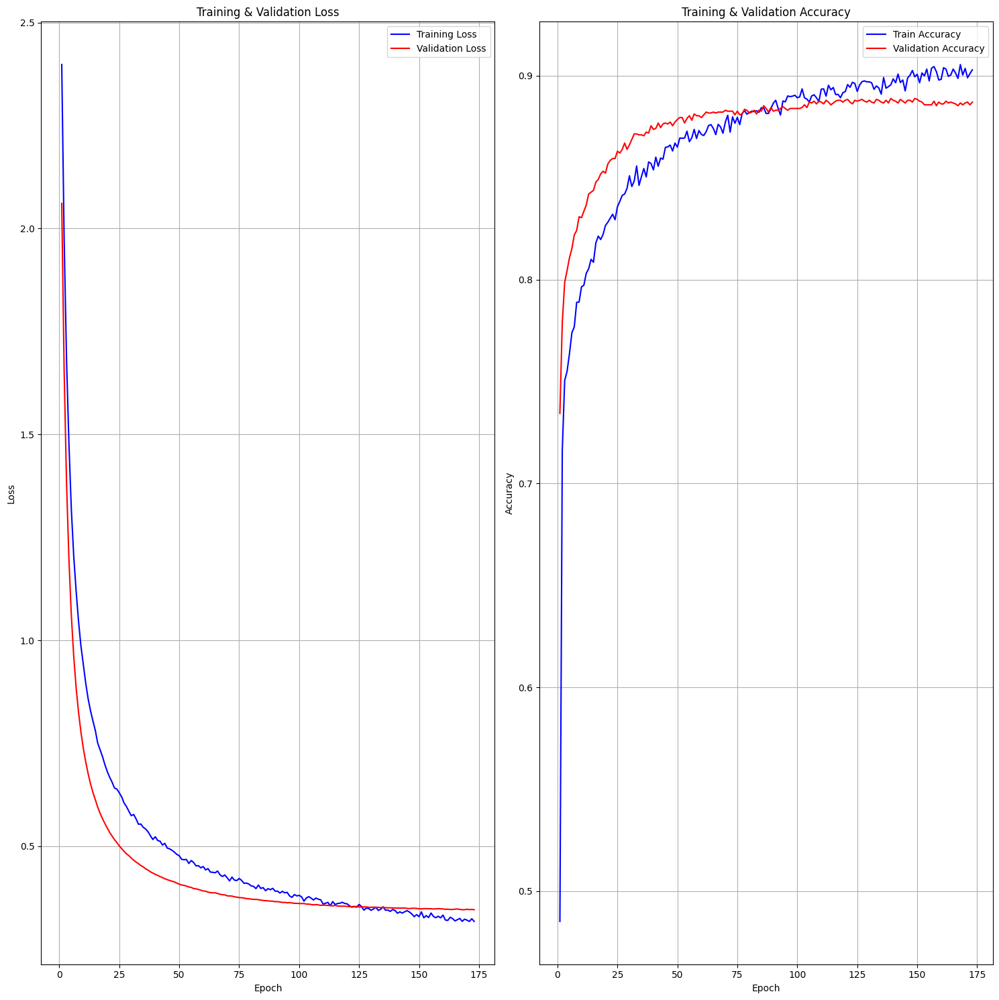

In [55]:
my_convnext = BaselineModel(backbone = convnext_full.features,
                            N_f = N_f_convnext).to(device)

EPOCHS = 250

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = my_convnext.parameters(), lr = 0.0005)
early_stopping = EarlyStopping(path = './best_checkpoint.pt')

[train_losses, train_accuracies, val_losses, val_accuracies], [y_train, yhat_train, y_val, yhat_val] = \
                train_classification(my_convnext, loss_fn, optimizer,
                                     train_loader, valid_loader,
                                     epochs = EPOCHS, verbose = True,
                                     confusion_matrix_data = True,
                                     early_stopping = early_stopping)

training_results(train_losses, train_accuracies, val_losses, val_accuracies, size = (15, 15))

,Accuracy,F1-score,Precision,Recall
Train,0.910156,0.910224,0.910456,0.910156
Validation/Test,0.886607,0.886644,0.887471,0.886607


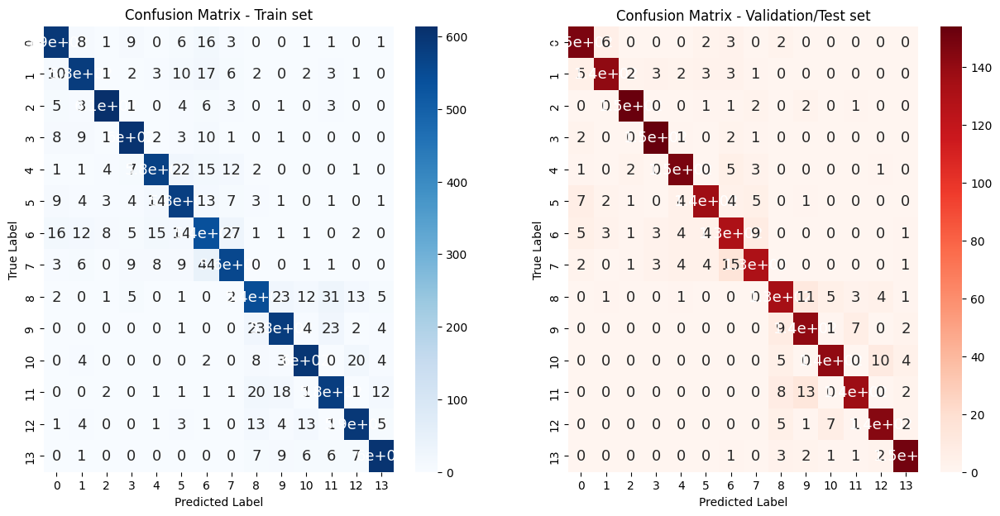

In [56]:
metrics_train, metrics_val, metrics_df, confusion_matrices = metrics_report(y_train, yhat_train, y_val, yhat_val,
                                                                            verbose = True, size = (15, 7))

In [83]:
sm = SaliencyMAP(my_convnext)

explain_predictions(sm, valid_loader, num_images = 30,
                       cmap = 'hot', transparency = 0.2,
                       mean = MEAN_RGB, std = STD_RGB, size = (12,6))

Output hidden; open in https://colab.research.google.com to view.

Salviamo i dati per eventuali future analisi:

In [58]:
torch.save({
    'model_state_dict': my_convnext.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'lr': optimizer.param_groups[0]['lr'],
}, "best_weights.pt")

In [59]:
from google.colab import files
files.download('/content/best_weights.pt')
files.download('/content/best_checkpoint.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Test and discussion

,Accuracy,F1-score,Precision,Recall
Test,0.88,0.88,0.88,0.88


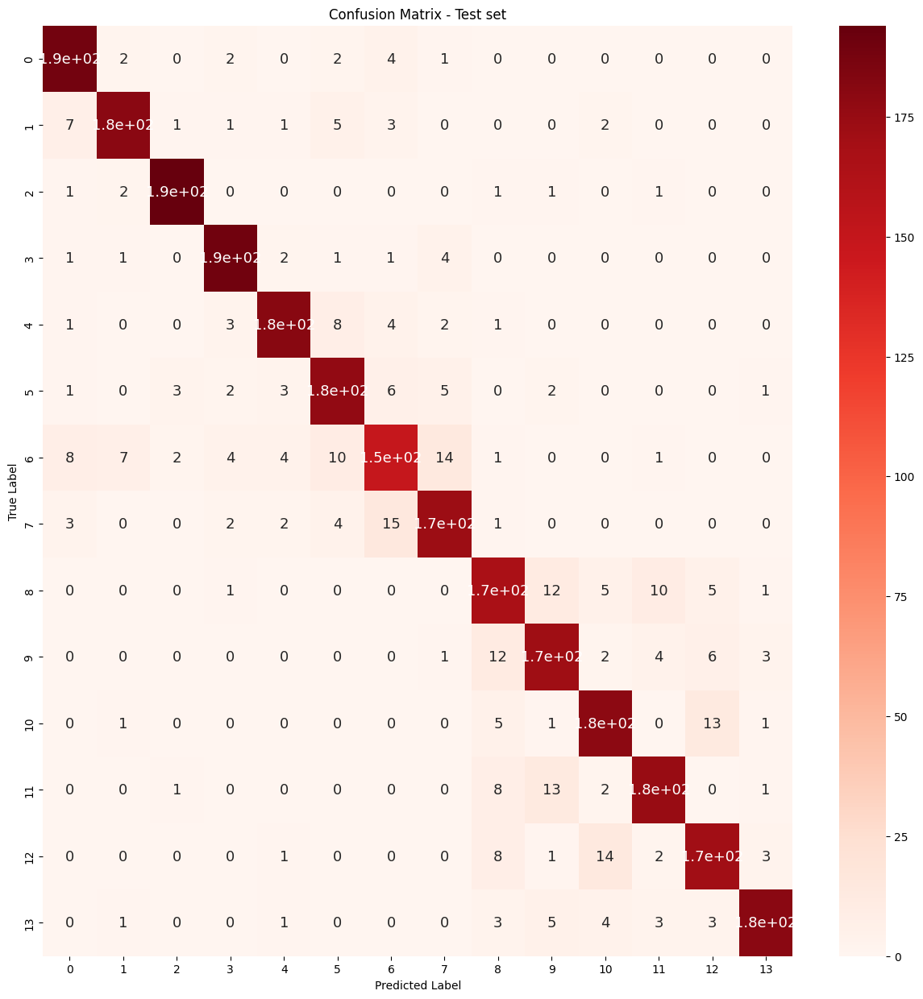

In [70]:
metrics_test, metrics_df, cm_test = test_model(my_convnext, loss_fn, test_loader, verbose = True, size = (15, 15))

In [67]:
show_predictions(my_convnext, loader = test_loader,
                 mean = MEAN_RGB, std = STD_RGB,
                 int_to_labels = int_to_labels,
                 num_images = 90, num_columns = 3, size = (17, 70))

Output hidden; open in https://colab.research.google.com to view.

In definitiva, abbiamo provato diversi modelli con diversi iperparametri, regolarizzazioni e architetture. Alla fine abbiamo definito un modello che overfitta molto poco, che sul test set si comporta come si comporta sul set di validation, e che ha un'accuracy, precision, recall e sopratutto F1-score soddisfacente (intorno all'88%).

Inoltre e' poco confuso su tutte le classi. Le maggiori confusioni, come si vede dalla cella sopra, vengono dalle classi 'taco' - 'taquito' e 'apple_pie' - 'cheescake', che sono classi di difficile distinzione anche ad occhio umano. In ogni caso, la confusione e' inferiore al 10% su queste coppie di classi. Per esempio nella cella subito sopra, l'unico errore e' stato classificare un 'Baked Potato' come 'Taco', ed effettivamente a prima vista potrebbe essere anche un errore umano.

Per migliorare ulteriormente il modello, sarebbe molto interessante sbloccare i pesi di qualche layer della CNN e fare un vero fine-tuning (con un learning rate molto basso, per non fare catastrophic forgetting!), ma sarebbe stato troppo lungo per questo progetto.